In [38]:
import pandas as pd
import glob
import matplotlib.pyplot as plt
import cv2
print(cv2.__version__)
import numpy as np
# import all the packages needed for Hough Transform
from skimage import color
from skimage.feature import canny
from skimage.transform import hough_circle, hough_circle_peaks
from skimage.draw import circle_perimeter, circle
import scipy as sc
import statistics as stats
import seaborn as sns
sns.set(style="whitegrid")

3.4.1


In [39]:
#Load start and finish frames for first and last trial

path = r"C:\Users\Daniellab\Desktop\Light_level_videos_second_batch\Data\Motion_Analysis\Centroids"

out_path = r"C:\Users\Daniellab\Desktop\Light_level_videos_second_batch\Data\Motion_Analysis\Kinematic_CSV"

outpath_fig_ = r"C:\Users\Daniellab\Desktop\Light_level_videos_second_batch\Data\Motion_Analysis\HeatMap\EntireTrial"

out_path_fig_r = r"C:\Users\Daniellab\Desktop\Light_level_videos_second_batch\Data\Motion_Analysis\Radial_Plot"

out_path_fig_t = r"C:\Users\Daniellab\Desktop\Light_level_videos_second_batch\Data\Motion_Analysis\Theta_Plot"

# all_path = r"C:\Users\Daniellab\Desktop\Light_level_videos_second_batch\Data\Motion_Analysis\First_Last_Centroids\ActuallyAllTrials"

file_list = glob.glob(path + "\\" + '*centroid*.csv')


In [40]:
#Sort the moths into either first or last trial 

Trial = ['First', 'Last']

for Trial in Trial:
        
        Trial_list = glob.glob(path + "\\" + "Final_position_centroid_method_" + Trial + '*c-3*.csv')

       

        df1=[]
        df2=[]
        df3=[]
        df4=[]
        df5=[]
        df6=[]
        
        ctr = 0
        for fpath in Trial_list:
            df = pd.read_csv(fpath)
            trialNum= df.index
            FrameNumber = df['FrameNumber']
            fname = df['Name']
            names = [fname[0]]*len(trialNum)
            t_type = [Trial]*len(trialNum)
            X_position = df['X_position']
            Y_position = df['Y_position']

            df1.extend(FrameNumber)
            df2.extend(trialNum)
            df3.extend(names)
            df4.extend(X_position)
            df5.extend(Y_position)
            df6.extend(t_type)
            ctr+=1
            print(ctr)

        new_df = (pd.DataFrame({
                                'FrameNumber': df1, 'trialNum': df2, 'name' : df3, 'X_position' : df4, 'Y_position' : df5, 'Visit' : df6}))
        print(Trial + '\t' + "has a total of" + '\t'+ str(ctr) + '\t' + "moths")
        new_df.to_csv(out_path + "\\" + Trial + "_Allmoths.csv")

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
First	has a total of	43	moths
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
Last	has a total of	39	moths


In [41]:
import glob


dFrame = pd.DataFrame()

file = glob.glob(out_path + "\\" + '*st_Allmoths.csv')

for file in file:
    print(file)
    df = pd.read_csv(file)
    dFrame = dFrame.append(df)
dFrame.to_csv(out_path  + "\\" + "First_Last_Visit_EveryMoth.csv")

C:\Users\Daniellab\Desktop\Light_level_videos_second_batch\Data\Motion_Analysis\Kinematic_CSV\First_Allmoths.csv
C:\Users\Daniellab\Desktop\Light_level_videos_second_batch\Data\Motion_Analysis\Kinematic_CSV\Last_Allmoths.csv


In [42]:
FL_df = pd.read_csv(out_path + "\\" + 'First_Last_Visit_Everymoth.csv')
 
nam_51 = FL_df.name[FL_df.name.str.contains('L')].unique()
len(nam_51)

43

In [43]:
rad_n = []
rad_nf = []
rad_nan_lo = [] 
rad_nan_hi = []
theta_0 = []
theta_f = []

for name in nam_51:
    print(name)
    video_path = r"C:\Users\Daniellab\Desktop\Light_level_videos_second_batch\Videos\All_videos_used_for_analysis"
    video_list = glob.glob(video_path + '\\' + name + '*.mp4')
    video_list
    vid = cv2.VideoCapture(video_list[0])

    width = vid.get(3)
    height = vid.get(4)
    
    ret = vid.set(1,1)
    print(ret)
    
    ret, frame = vid.read(1)

    # plt.imshow(frame)

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5,5), 0)

    edges = canny(blurred, sigma = 5)

    hough_radii = np.arange(50, 150, 1)
    hough_res = hough_circle(edges, hough_radii)
    accums, cx, cy, radii = hough_circle_peaks(hough_res, hough_radii,
                                               total_num_peaks=1)
    
    # read out points & subtract and plot for a window of frames


    x_low = FL_df[(FL_df.name == name) & (FL_df.name.str.contains('L0.1'))].X_position - cx[0]

    y_low = FL_df[(FL_df.name == name) & (FL_df.name.str.contains('L0.1'))].Y_position - cy[0]

    x_high = FL_df[(FL_df.name == name) & (FL_df.name.str.contains('L50'))].X_position - cx[0]

    y_high = FL_df[(FL_df.name == name) & (FL_df.name.str.contains('L50'))].Y_position - cy[0]

    x_000 = FL_df[(FL_df.name == name) & (FL_df.Visit.str.contains('First'))].X_position - cx[0]

    y_000 = FL_df[(FL_df.name == name) & (FL_df.Visit.str.contains('First'))].Y_position - cy[0]

    x_fff = FL_df[(FL_df.name == name) & (FL_df.Visit.str.contains('Last'))].X_position - cx[0]

    y_fff = FL_df[(FL_df.name == name) & (FL_df.Visit.str.contains('Last'))].Y_position - cy[0]


    # find out vector for each frame
    
    theta_first = list(np.arctan2(y_000, x_000)*180/np.pi)

    rad_nan_low = np.linalg.norm([x_low,y_low], axis = 0)/radii[0]


    theta_last = list(np.arctan2(y_fff, x_fff)*180/np.pi) 
    
    rad_nan_high = np.linalg.norm([x_high,y_high], axis = 0)/radii[0]



    rad_nan0  = np.linalg.norm([x_000,y_000], axis = 0)/radii[0]
    


    rad_nanf = np.linalg.norm([x_fff,y_fff], axis = 0)/radii[0]

    rad_n.extend(list(rad_nan0))
    rad_nf.extend(list(rad_nanf))
    rad_nan_hi.extend(list(rad_nan_high))
    rad_nan_lo.extend(list(rad_nan_low))
    theta_0.extend(theta_first)
    theta_f.extend(theta_last)

L0.1_c-3_m10
True
L0.1_c-3_m12
True
L0.1_c-3_m2
True
L0.1_c-3_m20
True
L0.1_c-3_m21
True
L0.1_c-3_m22
True
L0.1_c-3_m23
True
L0.1_c-3_m24
True
L0.1_c-3_m25
True
L0.1_c-3_m27
True
L0.1_c-3_m32
True
L0.1_c-3_m34
True
L0.1_c-3_m37
True
L0.1_c-3_m38
True
L0.1_c-3_m39
True
L0.1_c-3_m40
True
L0.1_c-3_m41
True
L0.1_c-3_m43
True
L0.1_c-3_m44
True
L0.1_c-3_m5
True
L0.1_c-3_m8
True
L50_c-3_m10
True
L50_c-3_m12
True
L50_c-3_m13
True
L50_c-3_m14
True
L50_c-3_m15
True
L50_c-3_m2
True
L50_c-3_m21
True
L50_c-3_m22
True
L50_c-3_m24
True
L50_c-3_m25
True
L50_c-3_m26
True
L50_c-3_m30
True
L50_c-3_m32
True
L50_c-3_m33
True
L50_c-3_m34
True
L50_c-3_m35
True
L50_c-3_m37
True
L50_c-3_m38
True
L50_c-3_m39
True
L50_c-3_m45
True
L50_c-3_m6
True
L50_c-3_m9
True


In [ ]:
# rad_nan_lo = [] 
# rad_nan_hi = []
# theta_lo = []
# theta_hi = []

# for name in nam_51:
#     print(name)
#     video_path = r"C:\Users\Daniellab\Desktop\Light_level_videos_second_batch\Videos\All_videos_used_for_analysis"
#     video_list = glob.glob(video_path + '\\' + name + '*.mp4')
#     video_list
#     vid = cv2.VideoCapture(video_list[0])

#     width = vid.get(3)
#     height = vid.get(4)
    
#     ret = vid.set(1,1)
#     print(ret)
    
#     ret, frame = vid.read(1)

#     # plt.imshow(frame)

#     gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
#     blurred = cv2.GaussianBlur(gray, (5,5), 0)

#     edges = canny(blurred, sigma = 5)

#     hough_radii = np.arange(50, 150, 1)
#     hough_res = hough_circle(edges, hough_radii)
#     accums, cx, cy, radii = hough_circle_peaks(hough_res, hough_radii,
#                                                total_num_peaks=1)
    
#     # read out points & subtract and plot for a window of frames


#     x_low = dFrame[(dFrame.name == name) & (dFrame.name.str.contains('L0.1'))].X_position - cx[0]

#     y_low = dFrame[(dFrame.name == name) & (dFrame.name.str.contains('L0.1'))].Y_position - cy[0]

#     x_high = dFrame[(dFrame.name == name) & (dFrame.name.str.contains('L50'))].X_position - cx[0]

#     y_high = dFrame[(dFrame.name == name) & (dFrame.name.str.contains('L50'))].Y_position - cy[0]

    

#     # find out vector for each frame
    
#     theta_low = list(np.arctan2(y_low, x_low)*180/np.pi)

#     rad_nan_low = np.linalg.norm([x_low,y_low], axis = 0)/radii[0]


#     theta_high = list(np.arctan2(y_high, x_high)*180/np.pi) 
    
#     rad_nan_high = np.linalg.norm([x_high,y_high], axis = 0)/radii[0]



    

    
#     rad_nan_hi.extend(list(rad_nan_high))
#     rad_nan_lo.extend(list(rad_nan_low))
#     theta_lo.extend(theta_low)
#     theta_hi.extend(theta_high)

In [44]:
rad_list_FL = []
rad_list_FL.extend(rad_n)
rad_list_FL.extend(rad_nf)
theta_list_FL = []
theta_list_FL.extend(theta_0)
theta_list_FL.extend(theta_f)
theta_list_FL
theta_positive_FL = []
for element in theta_list_FL:
    if element <= 0:
        element = element + 360
    else:
        element = element
    theta_positive_FL.append(element)

In [ ]:
# rad_list = []
# rad_list.extend(rad_nan_lo)
# rad_list.extend(rad_nan_hi)
# theta_list = []
# theta_list.extend(theta_lo)
# theta_list.extend(theta_hi)
# theta_list
# theta_positive = []
# for element in theta_list:
#     if element <= 0:
#         element = element + 360
#     else:
#         element = element
#     theta_positive.append(element)

In [45]:
theta_list_FL[6], theta_positive_FL[6]

(127.39445462750092, 127.39445462750092)

In [9]:
len(rad_list_FL), len(theta_positive_FL)

(127381, 127381)

In [46]:
label = {'0.1': 'low', '50': 'high'}
FL_df['lightLevel'] = FL_df['name'].map(lambda x : "LOW" if "0.1" in x else "HIGH" if "50" in x else "")
FL_df['Radial_Length'] = pd.Series(rad_list_FL, index=FL_df.index)
FL_df['Theta'] = pd.Series(theta_positive_FL, index=FL_df.index)
# FL_df.to_csv(out_path  + "\\" + "First_Last_Visit_EveryMoth.csv")

In [ ]:
# label = {'0.1': 'low', '50': 'high'}
# dFrame['lightLevel'] = dFrame['name'].map(lambda x : "LOW" if "0.1" in x else "HIGH" if "50" in x else "")
# dFrame['Radial_Length'] = pd.Series(rad_list, index=dFrame.index)
# dFrame['Theta'] = pd.Series(theta_positive, index=dFrame.index)
# # dFrame.to_csv(all_path  + "\\" + "EntireTrial_AllMoths.csv")

In [47]:
FL_df.head()

,Unnamed: 0,Unnamed: 0.1,FrameNumber,trialNum,name,X_position,Y_position,Visit,lightLevel,Radial_Length,Theta
0,0,0,20372,0,L0.1_c-3_m10,NaN,NaN,First,LOW,NaN,NaN
1,1,1,20373,1,L0.1_c-3_m10,NaN,NaN,First,LOW,NaN,NaN
2,2,2,20374,2,L0.1_c-3_m10,NaN,NaN,First,LOW,NaN,NaN
3,3,3,20375,3,L0.1_c-3_m10,NaN,NaN,First,LOW,NaN,NaN
4,4,4,20376,4,L0.1_c-3_m10,80.775759,407.542261,First,LOW,3.946745,142.712626


In [ ]:
# mean_radial_length_low_FL = []
# mean_radial_length_high_FL = []
# standard_deviation_low_FL = []
# standard_deviation_high_FL = []
# for name in nam_51:
#     radial_list_FL = FL_df[(FL_df.name == name)].Radial_Length
#     useful_radial_list_FL = list(radial_list_FL[~np.isnan(radial_list_FL)])
#     if name.startswith('L0.1') & np.any(useful_radial_list_FL):
#         mrll_FL = sum(useful_radial_list_FL)/len(useful_radial_list_FL)
#         stdl_FL = np.std(useful_radial_list_FL)
#         mean_radial_length_low_FL.append(mrll_FL)
#         standard_deviation_low_FL.append(stdl_FL)
#     elif name.startswith('L50')  & np.any(useful_radial_list_FL):
#         mrlh_FL = sum(useful_radial_list_FL)/len(useful_radial_list_FL)
#         stdh_FL = np.std(useful_radial_list_FL)
#         mean_radial_length_high_FL.append(mrlh_FL)
#         standard_deviation_high_FL.append(stdh_FL)
# len(nam_51), len(mean_radial_length_low_FL), len(mean_radial_length_high_FL), len(standard_deviation_high_FL)

In [ ]:
# mean_radial_length_low = []
# mean_radial_length_high = []
# standard_deviation_low = []
# standard_deviation_high = []
# for name in nam_51:
#     print(name)
#     radial_list = dFrame[(dFrame.name == name)].Radial_Length
#     useful_radial_list = list(radial_list[~np.isnan(radial_list)])
#     if name.startswith('L0.1') & np.any(useful_radial_list):
#         print(name)
#         mrll = sum(useful_radial_list)/len(useful_radial_list)
#         stdl = np.std(useful_radial_list)
#         mean_radial_length_low.append(mrll)
#         standard_deviation_low.append(stdl)
#     elif name.startswith('L50')  & np.any(useful_radial_list):
#         mrlh = sum(useful_radial_list)/len(useful_radial_list)
#         stdh = np.std(useful_radial_list)
#         mean_radial_length_high.append(mrlh)
#         standard_deviation_high.append(stdh)
# len(nam_51), len(mean_radial_length_low), len(mean_radial_length_high), len(standard_deviation_high)

In [ ]:
# median_radial_length_low_FL = []
# median_radial_length_high_FL = []
# iqr_low_FL = []
# iqr_high_FL = []   
# for name in nam_51:
#     radial_list_FL = FL_df[(FL_df.name == name)].Radial_Length
#     useful_radial_list_FL = list(radial_list_FL[~np.isnan(radial_list_FL)])
#     if name.startswith('L0.1') & np.any(useful_radial_list_FL):
#         med_l_FL = stats.median(useful_radial_list_FL)
#         iqr_l_FL = sc.stats.iqr(useful_radial_list_FL)
#         median_radial_length_low_FL.append(med_l_FL)
#         iqr_low_FL.append(iqr_l_FL)
#     elif name.startswith('L50')  & np.any(useful_radial_list_FL):
#         med_h_FL = stats.median(useful_radial_list_FL)
#         median_radial_length_high_FL.append(med_h_FL)
#         iqr_h_FL = sc.stats.iqr(useful_radial_list_FL)
#         iqr_high_FL.append(iqr_h_FL)
# len(nam_51), len(median_radial_length_low_FL), len(median_radial_length_high_FL), len(iqr_high_FL)

In [ ]:
# median_radial_length_low = []
# median_radial_length_high = []
# iqr_low = []
# iqr_high = []   
# for name in nam_51:
#     radial_list = dFrame[(dFrame.name == name)].Radial_Length
#     useful_radial_list = list(radial_list[~np.isnan(radial_list)])
#     if name.startswith('L0.1') & np.any(useful_radial_list):
#         med_l = stats.median(useful_radial_list)
#         iqr_l = sc.stats.iqr(useful_radial_list)
#         median_radial_length_low.append(med_l)
#         iqr_low.append(iqr_l)
#     elif name.startswith('L50')  & np.any(useful_radial_list):
#         med_h = stats.median(useful_radial_list)
#         median_radial_length_high.append(med_h)
#         iqr_h = sc.stats.iqr(useful_radial_list)
#         iqr_high.append(iqr_h)
#     else:
#         print(name)
# len(nam_51), len(median_radial_length_low), len(median_radial_length_high), len(iqr_high)

In [ ]:
# radial_length_low = []
# radial_length_high = []
# for name in nam_51:
#     radial_list = dFrame[(dFrame.name == name)].Radial_Length
#     if name.startswith('L0.1') & np.any(useful_radial_list):
#         radial_list_low = dFrame[(dFrame.name == name)].Radial_Length
#         useful_radial_list_low = list(radial_list_low[~np.isnan(radial_list_low)])
#         radial_length_low.append(useful_radial_list_low)
#     elif name.startswith('L50') & np.any(useful_radial_list):
#         radial_list_high = dFrame[(dFrame.name == name)].Radial_Length
#         useful_radial_list_high = list(radial_list_high[~np.isnan(radial_list_high)])
#         radial_length_high.append(useful_radial_list_high)

In [48]:
median_radial_length_low_first = []
median_radial_length_high_first = []
iqr_lowf= []
iqr_highf = []   
median_radial_length_low_last = []
median_radial_length_high_last = []
iqr_lowl= []
iqr_highl = [] 
i= 0
for name in nam_51:
    radial_list_first = FL_df[(FL_df.name == name) & (FL_df.Visit.str.contains('First'))].Radial_Length
    useful_radial_list_first = list(radial_list_first[~np.isnan(radial_list_first)])
    radial_list_last = FL_df[(FL_df.name == name) & (FL_df.Visit.str.contains('Last'))].Radial_Length
    useful_radial_list_last = list(radial_list_last[~np.isnan(radial_list_last)])
    if name.startswith('L0.1'):
        
        if np.any(useful_radial_list_first) & np.any(useful_radial_list_last):
            i+=1
            med_lf = stats.median(useful_radial_list_first)
            iqr_lf = sc.stats.iqr(useful_radial_list_first)
            median_radial_length_low_first.append(med_lf)
            iqr_lowf.append(iqr_lf)
            med_ll = stats.median(useful_radial_list_last)
            iqr_ll = sc.stats.iqr(useful_radial_list_last)
            median_radial_length_low_last.append(med_ll)
            iqr_lowl.append(iqr_ll)
        elif np.any(useful_radial_list_first):
            print(name)
            med_lf = stats.median(useful_radial_list_first)
            iqr_lf = sc.stats.iqr(useful_radial_list_first)
            median_radial_length_low_first.append(med_lf)
    elif name.startswith('L50'):
        if np.any(useful_radial_list_first) & np.any(useful_radial_list_last):
            med_hf = stats.median(useful_radial_list_first)
            median_radial_length_high_first.append(med_hf)
            iqr_hf = sc.stats.iqr(useful_radial_list_first)
            iqr_highf.append(iqr_hf)
            med_hl = stats.median(useful_radial_list_last)
            median_radial_length_high_last.append(med_hl)
            iqr_hl = sc.stats.iqr(useful_radial_list_last)
            iqr_highl.append(iqr_hl)
        elif np.any(useful_radial_list_first):
            print(name)
            med_hf = stats.median(useful_radial_list_first)
            median_radial_length_high_first.append(med_hf)
            iqr_hf = sc.stats.iqr(useful_radial_list_first)
            iqr_highf.append(iqr_hf)
len(nam_51), len(median_radial_length_low_first), len(median_radial_length_low_last), len(median_radial_length_high_first), len(median_radial_length_high_last)

L0.1_c-3_m24
L0.1_c-3_m39
L50_c-3_m24
L50_c-3_m25


(43, 21, 19, 22, 20)

In [49]:
median_radial_length_low_last, median_radial_length_low_first

([2.7827764166028945,
  2.9236290862031895,
  2.0729367310739706,
  2.0508760793575225,
  1.8978276187010663,
  2.1729611336816435,
  1.9938556516966681,
  1.8854131743686442,
  2.781012354826065,
  2.451732318775496,
  1.35559164928676,
  1.8324404924171074,
  1.8606876862972612,
  3.3439868573080513,
  2.072854523386334,
  1.8664229435598163,
  1.816038798730757,
  2.312209140867476,
  2.260717082574509],
 [3.6257754886696025,
  2.1854122255350754,
  2.211657256366993,
  1.8620037732339754,
  2.082032645320233,
  2.255843217149389,
  3.476464918273626,
  2.276614641642576,
  1.967911035629452,
  2.7537914926360734,
  2.6757594131634947,
  1.5389640581696618,
  1.9147821641567158,
  2.103784985682257,
  2.675465638490164,
  2.1493760507147726,
  2.0094461642933297,
  1.947787708472637,
  1.7423952010019332,
  2.1930192006989113,
  2.041624505535932])

In [50]:
median_radial_length_high_last, median_radial_length_high_first

([2.7193430482245,
  2.3944630882826927,
  2.8728171024268345,
  2.539020464140785,
  3.404979709604622,
  3.1614901157763273,
  1.7122782659578077,
  2.3186920554678814,
  2.6815328092594424,
  2.509510191896971,
  2.1223528995728174,
  2.3545766614703236,
  2.6447087330168366,
  3.2380527419361456,
  1.8088789881441394,
  3.449912496492618,
  1.5660027147091542,
  2.9185113425441935,
  2.2960616940074656,
  2.5768205197888934],
 [2.7578000355847636,
  3.7079547543148754,
  2.177531979234427,
  2.0074610064780636,
  4.179056350789539,
  2.7029600663039166,
  2.970532921398125,
  2.0164095648951093,
  2.421477472843268,
  4.1278391000769465,
  3.513039673864154,
  3.8015726168722472,
  3.3210114620732893,
  4.053635532059053,
  2.4174753888840295,
  4.1774762995480526,
  4.118525139909932,
  3.5248591911622595,
  1.7638543057659581,
  2.661840839726537,
  2.29277780472296,
  2.4438349024580575])

In [ ]:
# data = [mean_radial_length_low_FL, mean_radial_length_high_FL]
# labels = ["Low", "High"]
# fig, ax = plt.subplots()
# ax.set_xlabel('Light Level')
# ax.set_ylabel('Radial Length')
# ax.set_ylim(1,4)
# ax.boxplot(data)
# ax.set_xticklabels(labels)
# ax.set_title('Mean Radial Length')



# plt.show()
# # fig.savefig(out_path_fig_r + "\\" + "Mean_Radial_length_box.png")

In [ ]:
# data = [mean_radial_length_low, mean_radial_length_high]
# labels = ["Low", "High"]
# fig, ax = plt.subplots()
# ax.set_xlabel('Light Level')
# ax.set_ylabel('Radial Length')
# ax.set_ylim(1,4)
# ax.boxplot(data)
# ax.set_xticklabels(labels)
# ax.set_title('Mean Radial Length')



# plt.show()
# fig.savefig(out_path_fig_r + "\\" + "EntireTrial_Mean_Radial_length_box.png")

In [ ]:
# data_median = [median_radial_length_low_FL, median_radial_length_high_FL]
# labels = ["Low", "High"]
# fig, ax = plt.subplots()
# ax.set_xlabel('Light Level')
# ax.set_ylabel('Radial Length')
# ax.set_ylim(1,4)
# ax.boxplot(data_median)
# ax.set_xticklabels(labels)
# ax.set_title('Median Radial Length')



# plt.show()
# # fig.savefig(out_path_fig_r + "\\" + "Median_Radial_length_box.png")

In [ ]:
# data_median = [median_radial_length_low, median_radial_length_high]
# labels = ["Low", "High"]
# fig, ax = plt.subplots()
# ax.set_xlabel('Light Level')
# ax.set_ylabel('Radial Length')
# ax.set_ylim(1,4)
# ax.boxplot(data_median)
# ax.set_xticklabels(labels)
# ax.set_title('Median Radial Length')



# plt.show()
# fig.savefig(out_path_fig_r + "\\" + "EntireTrial_Median_Radial_length_box.png")

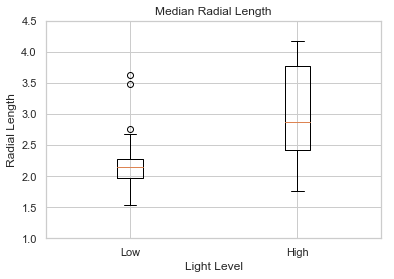

In [51]:
# Plotting the distribution of medians comparing light levels only considering the first trial
data_median_first = [median_radial_length_low_first, median_radial_length_high_first]
labels = ["Low", "High"]
fig, ax = plt.subplots()
ax.set_xlabel('Light Level')
ax.set_ylabel('Radial Length')
ax.set_ylim(1,4.5)
ax.boxplot(data_median_first)
ax.set_xticklabels(labels)
ax.set_title('Median Radial Length')



plt.show()
# fig.savefig(out_path_fig_r + "\\" + "First_Median_Radial_length_box.png")

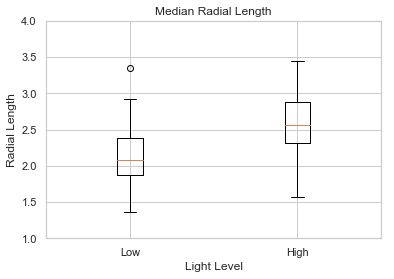

In [52]:
# Plotting the distribution of medians comparing light levels only considering the last trial
data_median_last = [median_radial_length_low_last, median_radial_length_high_last]
labels = ["Low", "High"]
fig, ax = plt.subplots()
ax.set_xlabel('Light Level')
ax.set_ylabel('Radial Length')
ax.set_ylim(1,4)
ax.boxplot(data_median_last)
ax.set_xticklabels(labels)
ax.set_title('Median Radial Length')



plt.show()
# fig.savefig(out_path_fig_r + "\\" + "Last_Median_Radial_length_box.png")

In [ ]:
# # the Welch's T-test assumes the distributions are normal, whereas the ks test makes no assumptions
# # Testing significant differences between the population of means for each light level
# sc.stats.ks_2samp(mean_radial_length_low, mean_radial_length_high)

In [ ]:
# # the Welch's T-test assumes the distributions are normal, whereas the ks test makes no assumptions
# # Testing significant differences between the population of means for each light level
# sc.stats.ks_2samp(mean_radial_length_low, mean_radial_length_high)

In [ ]:
# # Testing significant differences between the population of medians for each light level considering all trials
# sc.stats.ks_2samp(median_radial_length_low, median_radial_length_high)

In [ ]:
# # Testing significant differences between the population of medians for each light level considering all trials
# sc.stats.ks_2samp(median_radial_length_low, median_radial_length_high)

In [53]:
# Testing significant differences between the population of medians for each light level only considering the first trial
sc.stats.ks_2samp(median_radial_length_low_first, median_radial_length_high_first)

Ks_2sampResult(statistic=0.58008658008658, pvalue=0.0007237493363390694)

In [54]:
# Testing significant differences between the population of medians for each light level only considering the last trial
sc.stats.ks_2samp(median_radial_length_low_last, median_radial_length_high_last)

Ks_2sampResult(statistic=0.48684210526315785, pvalue=0.012321081258551558)

In [ ]:
# # Testing significant differences between the population of std for each light level
# sc.stats.ks_2samp(standard_deviation_low, standard_deviation_high)

In [ ]:
# # Testing significant differences between the population of iqr for each light level
# sc.stats.ks_2samp(iqr_low, iqr_high)

In [ ]:
# # Testing significant differences between the population of iqr for each light level only considering the first trial
# sc.stats.ks_2samp(iqr_lowf, iqr_highf)

In [ ]:
# # Testing significant differences between the population of iqr for each light level only considering the last trial
# sc.stats.ks_2samp(iqr_lowl, iqr_highl)

In [ ]:
# # Testing significant differences between the population of iqr for each light level only considering low light
# sc.stats.ks_2samp(iqr_lowf, iqr_lowl)

In [ ]:
# # standard deviation of the distribution of means for each light level
# np.std(mean_radial_length_low), np.std(mean_radial_length_high)

In [ ]:
# # iqr of the distribution of medians for each light level
# sc.stats.iqr(median_radial_length_low), sc.stats.iqr(median_radial_length_high)

In [ ]:
fig, ax = plt.subplots(1,2, sharex = True, sharey = True)
weights = np.ones_like(mean_radial_length_low)/float(len(mean_radial_length_low))
weights_hi = np.ones_like(mean_radial_length_high)/float(len(mean_radial_length_high))
ax[0].hist(mean_radial_length_low, weights=weights)
ax[0].set_xlim(1,4)
ax[1].hist(mean_radial_length_high, weights=weights_hi)

In [ ]:

ax = sns.violinplot(x="Visit", y="Radial_Length", hue = "lightLevel", data=FL_df, palette="Set2")
fig = ax.get_figure()

# fig.savefig(out_path_fig_r + "\\" + "All_Radial_length_violin.png")

In [ ]:

ax = sns.boxplot(x="Visit", y="Radial_Length", hue = "lightLevel", data=FL_df, palette="Set2")
fig = ax.get_figure()


# fig.savefig(out_path_fig_r + "\\" + "All_Radial_length_box.png")

In [ ]:

ax = sns.violinplot(x="Visit", y="Theta", hue = "lightLevel", data=FL_df, palette="Set1")
fig = ax.get_figure()

# fig.savefig(out_path_fig_t + "\\" + "All_Theta_violin.png")

In [ ]:

ax = sns.boxplot(x="Visit", y="Theta", hue = "lightLevel", data=FL_df, palette="Set1")
fig = ax.get_figure()
# out_path_fig_t = r"C:\Users\Daniellab\Desktop\Light_level_videos_second_batch\Data\Motion_Analysis\Theta_Plot"
# fig.savefig(out_path_fig_t + "\\" + "All_Theta_box.png")

C:\Users\Daniellab\Anaconda3\lib\site-packages\numpy\lib\histograms.py:754: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\Daniellab\Anaconda3\lib\site-packages\numpy\lib\histograms.py:755: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


L0.1_c-3_m24
L0.1_c-3_m39


C:\Users\Daniellab\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


L50_c-3_m24
L50_c-3_m25


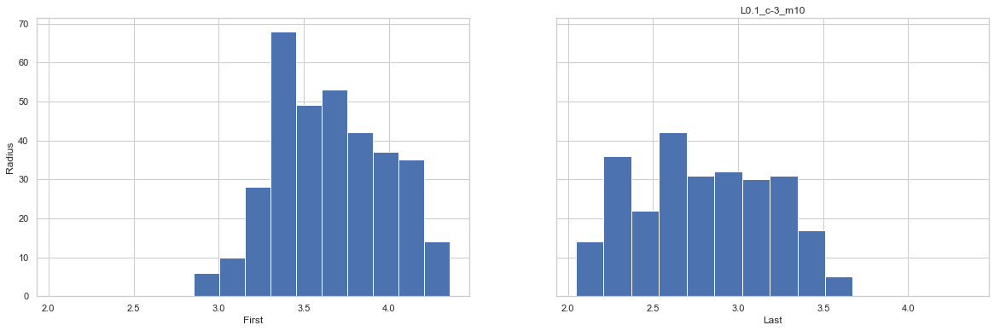

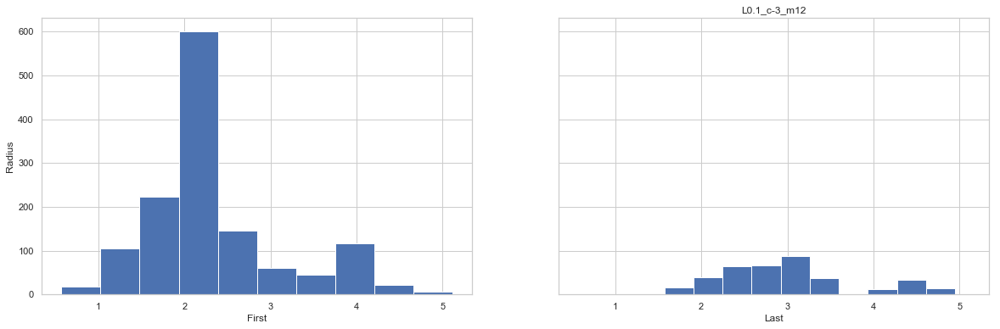

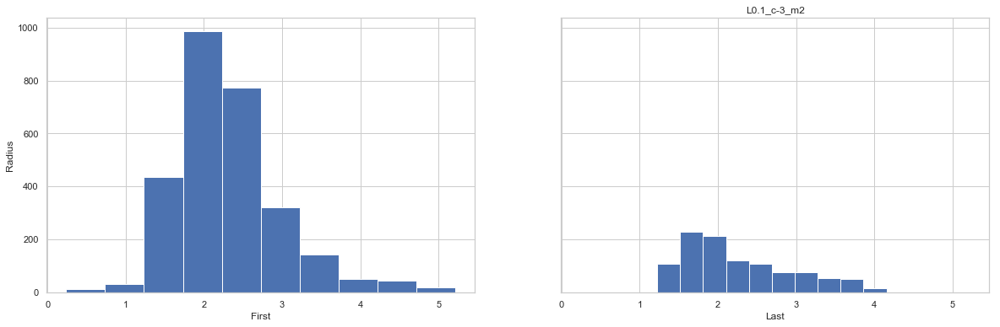

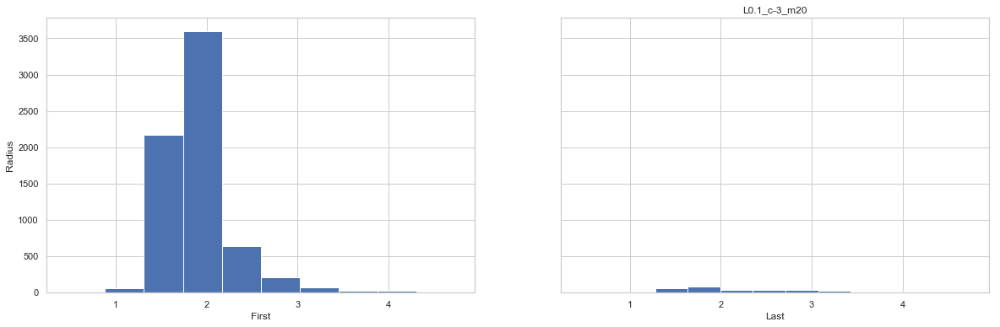

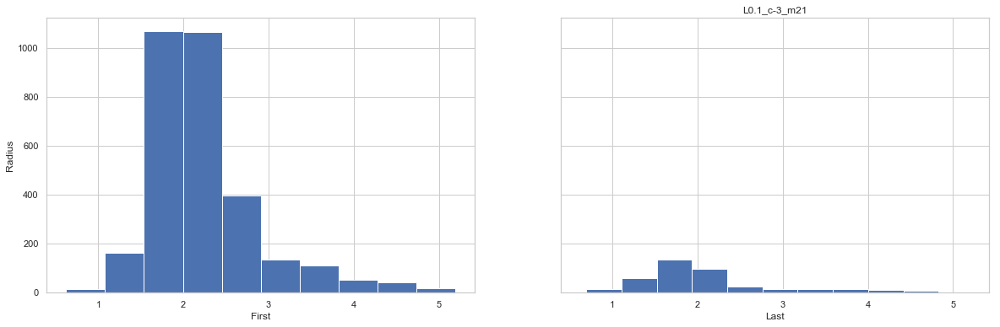

...

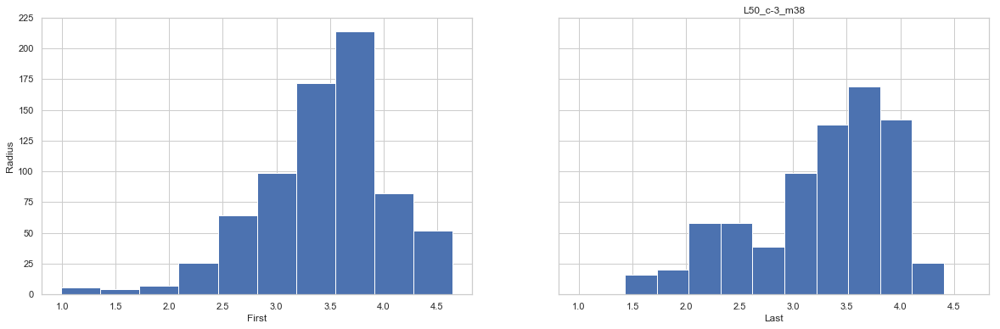

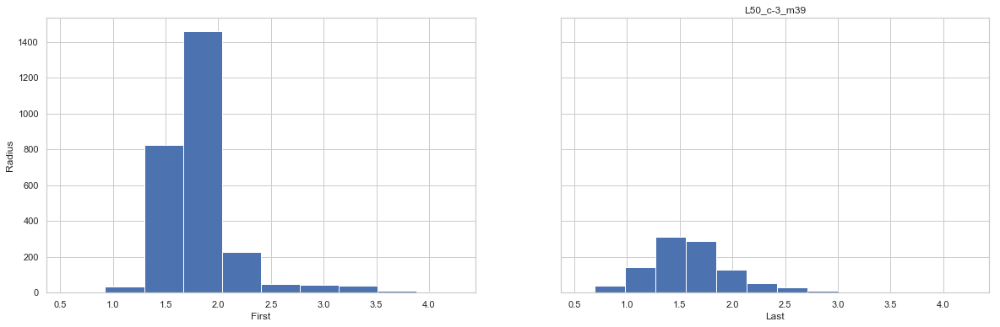

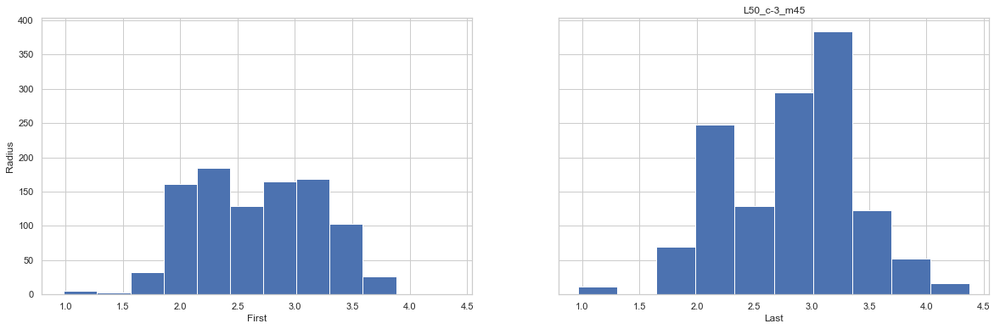

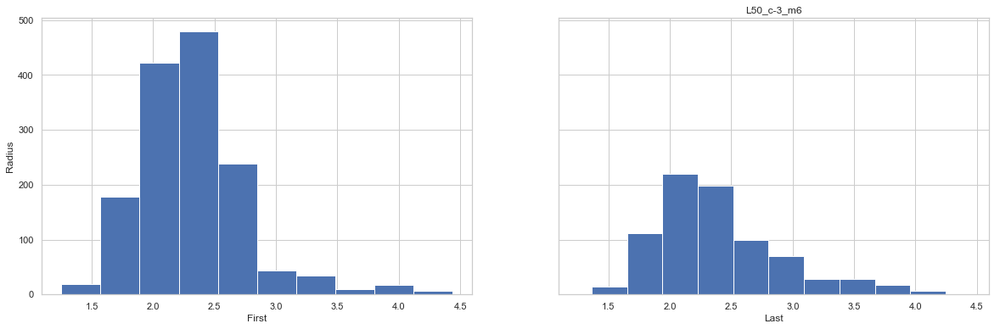

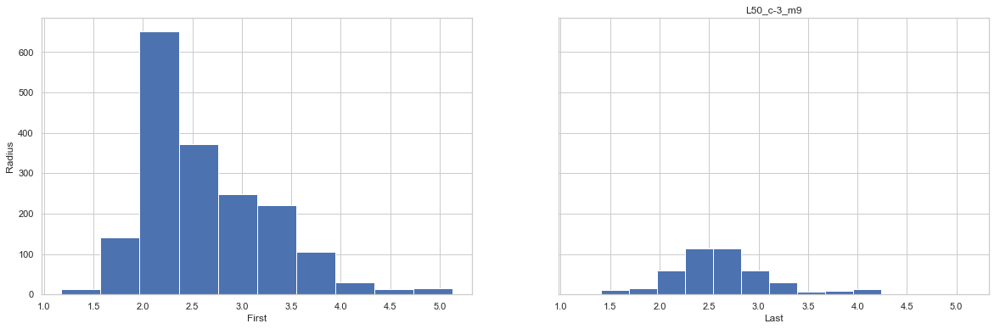

In [55]:
#plot in terms of r
for name in nam_51:
    rad_first_visit = FL_df[(FL_df.name == name) & (FL_df.Visit.str.contains('First'))].Radial_Length
    rad_last_visit = FL_df[(FL_df.name == name) & (FL_df.Visit.str.contains('Last'))].Radial_Length
    
#     if len(list(rad_first_visit)) > 0:
    if any(list(~np.isnan(rad_first_visit))) == True & any(list(~np.isnan(rad_last_visit))) == True:
        fig, ax = plt.subplots(1, 2, sharex = True, sharey = True, figsize = (20,6), )
        ax[0].hist(rad_first_visit)
        ax[0].set_ylabel("Radius")
        ax[0].set_xlabel("First")
        ax[1].hist(rad_last_visit)
        ax[1].set_title(name)
        ax[1].set_xlabel("Last")
        plt.savefig(r"C:\Users\Daniellab\Desktop\Light_level_videos_second_batch\Data\Motion_Analysis\Radial_Plot" + "\\" + name + ".png")
    else:
        print(name)

L0.1_c-3_m24
L0.1_c-3_m39
L50_c-3_m24
L50_c-3_m25


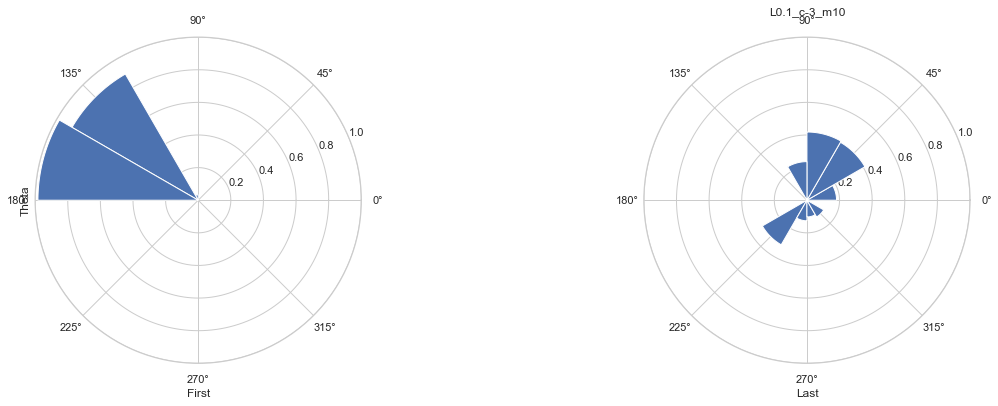

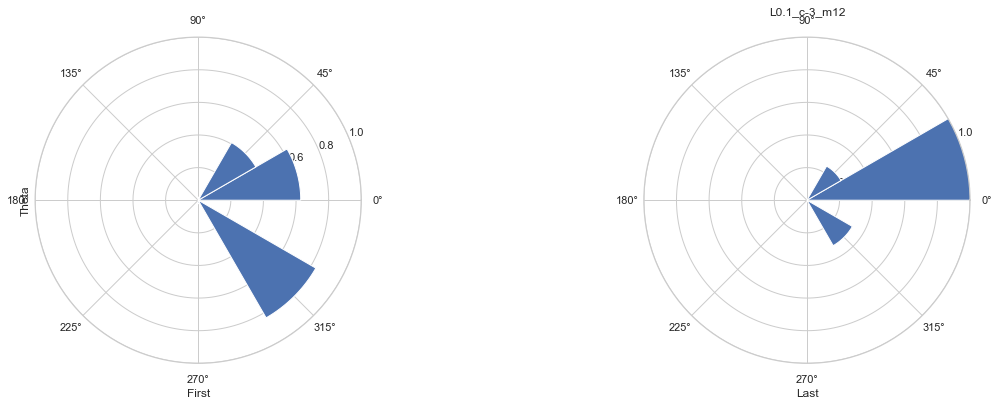

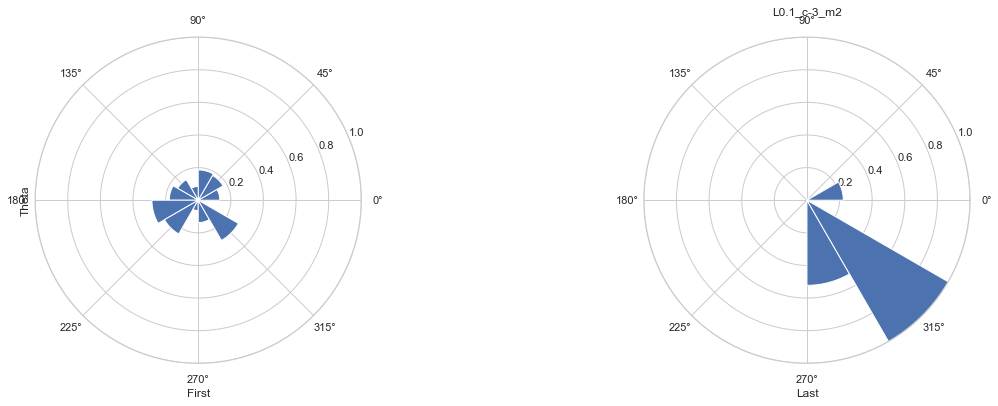

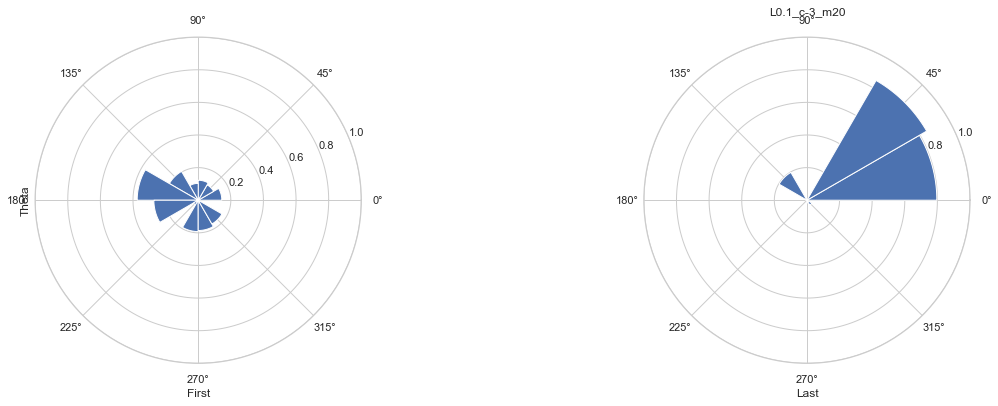

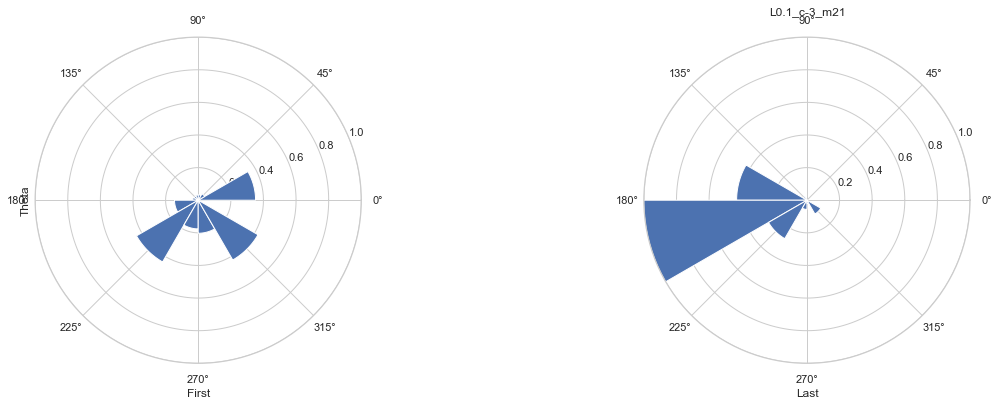

...

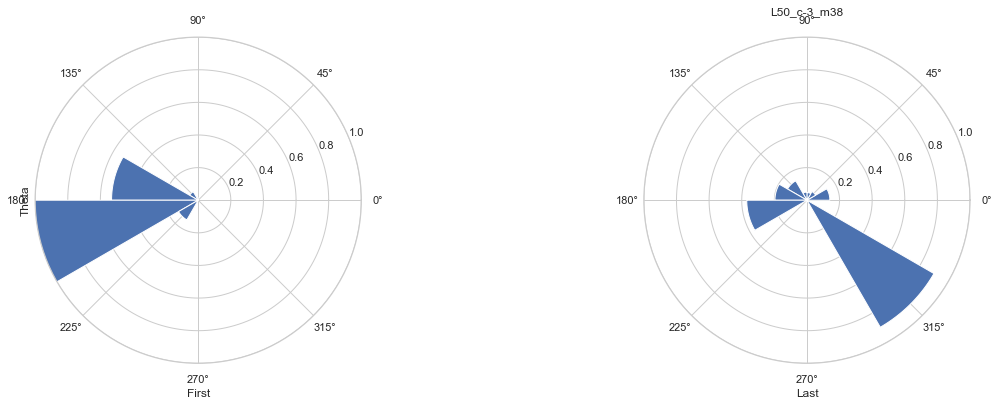

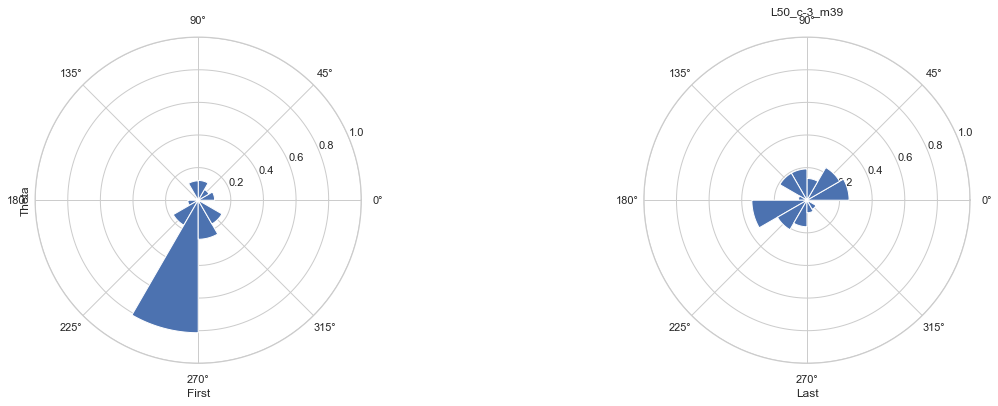

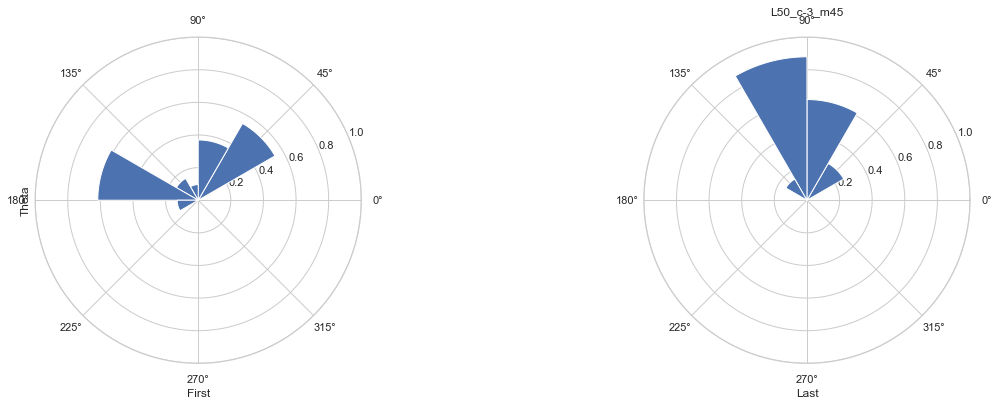

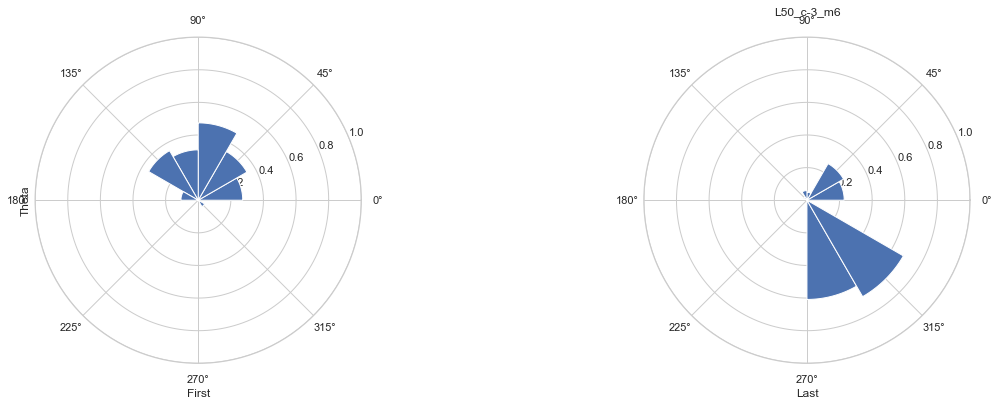

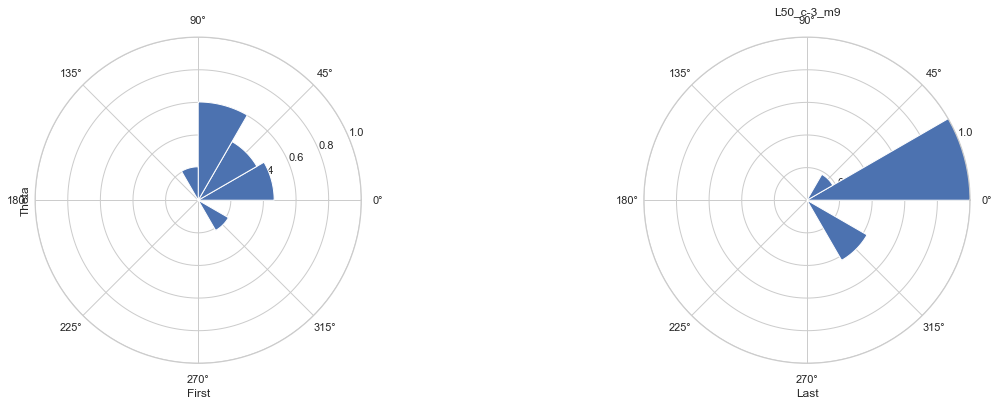

In [63]:
for name in nam_51: 

    theta_pulled_first = FL_df[(FL_df.name == name) & (FL_df.Visit.str.contains('First'))].Theta * np.pi/180
    theta_pulled_last = FL_df[(FL_df.name == name) & (FL_df.Visit.str.contains('Last'))].Theta * np.pi/180

    rad_first_visit = FL_df[(FL_df.name == name) & (FL_df.Visit.str.contains('First'))].Radial_Length
    rad_last_visit = FL_df[(FL_df.name == name) & (FL_df.Visit.str.contains('Last'))].Radial_Length
    
    

    if any(list(~np.isnan(rad_first_visit))) == True & any(list(~np.isnan(rad_last_visit))) == True:
        fig, ax = plt.subplots(1, 2, sharex = True, sharey = False, figsize = (20,6), subplot_kw=dict(polar=True))

        
        nbin =np.asarray([0, 30, 60,90,120,150,180,210,240,270,300,330])*np.pi/180.0
        ax[0].hist(theta_pulled_first, bins = nbin, density = True)
        ax[0].set_ylabel("Theta")
        ax[0].set_xlabel("First")
        ax[0].set_ylim(0,1)
        ax[1].hist(theta_pulled_last, bins = nbin, density = True)
        ax[1].set_title(name)
        ax[1].set_xlabel("Last")
        ax[1].set_ylim(0,1)

        plt.savefig(r"C:\Users\Daniellab\Desktop\Light_level_videos_second_batch\Data\Motion_Analysis\Theta_Plot\Rose" + "\\" + name + "_Hist.png")
    else:
        print(name)
    


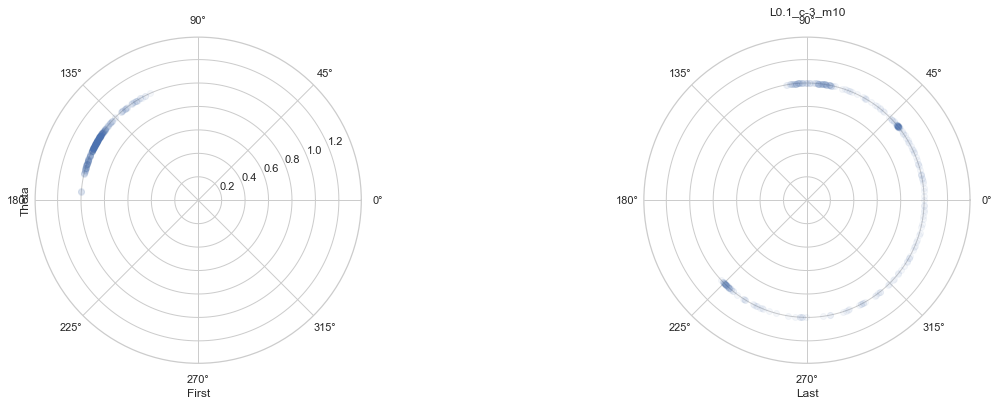

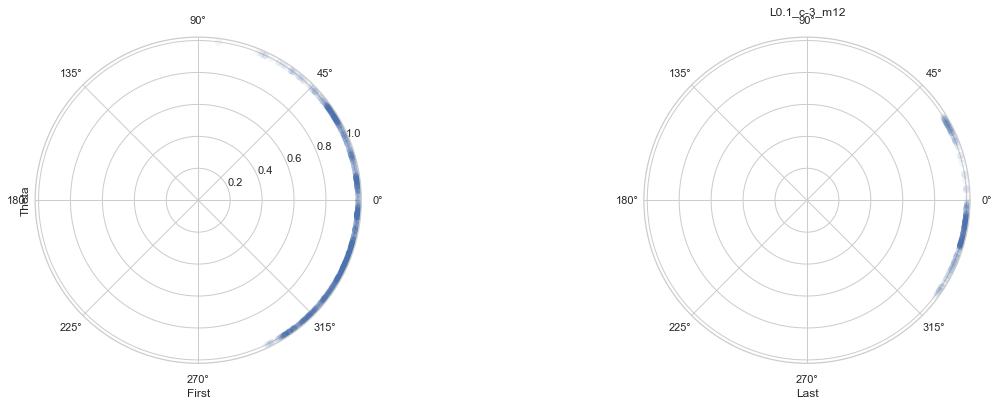

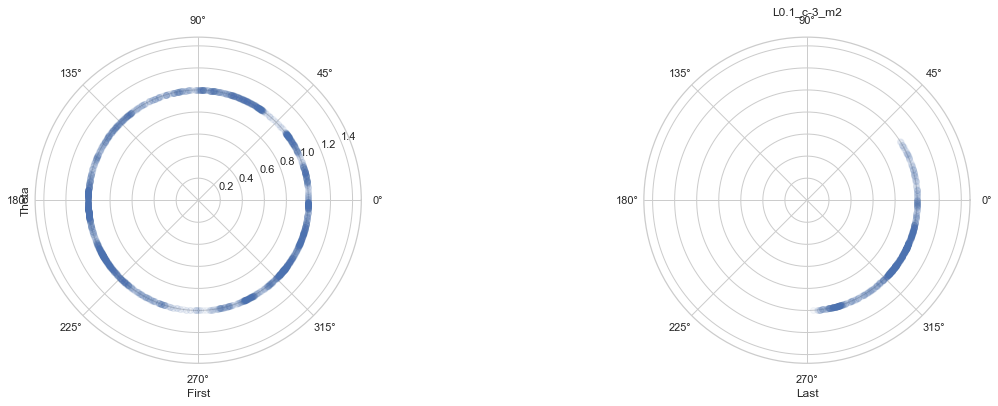

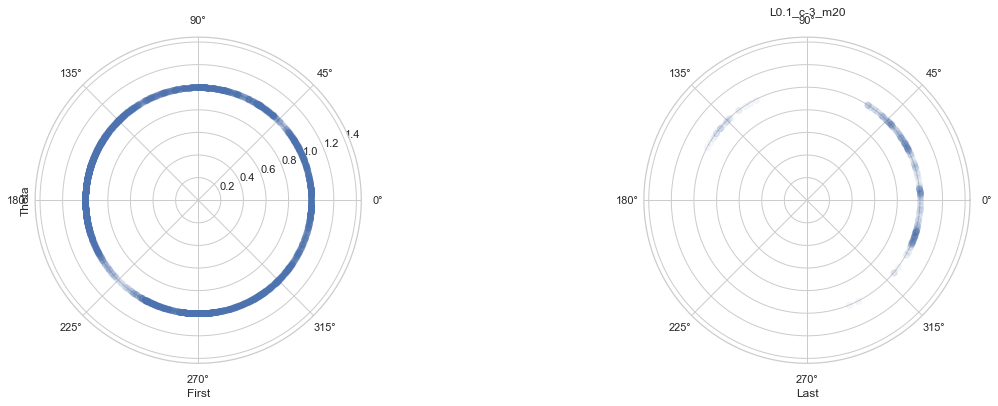

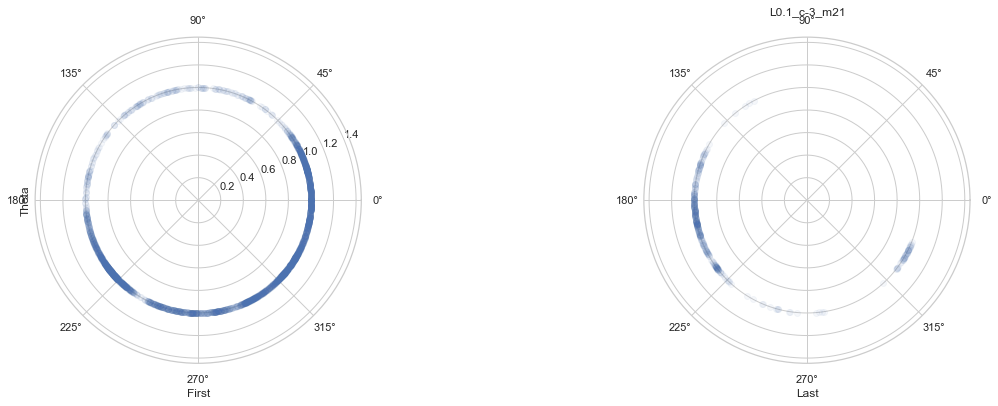

...

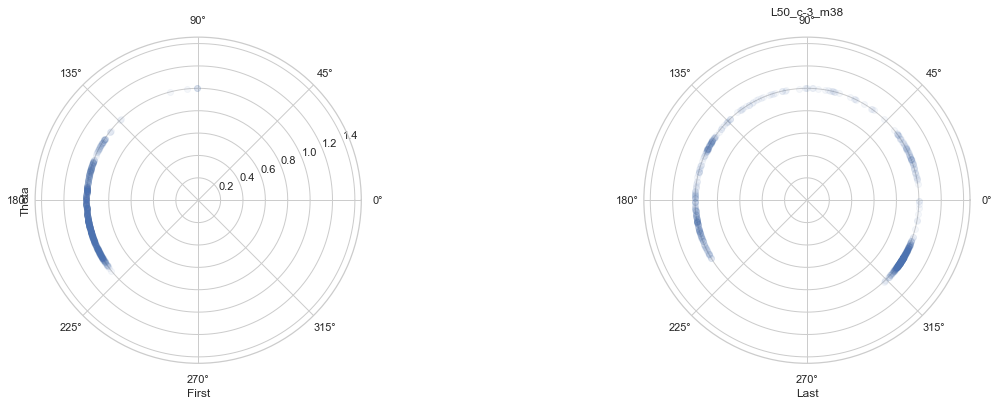

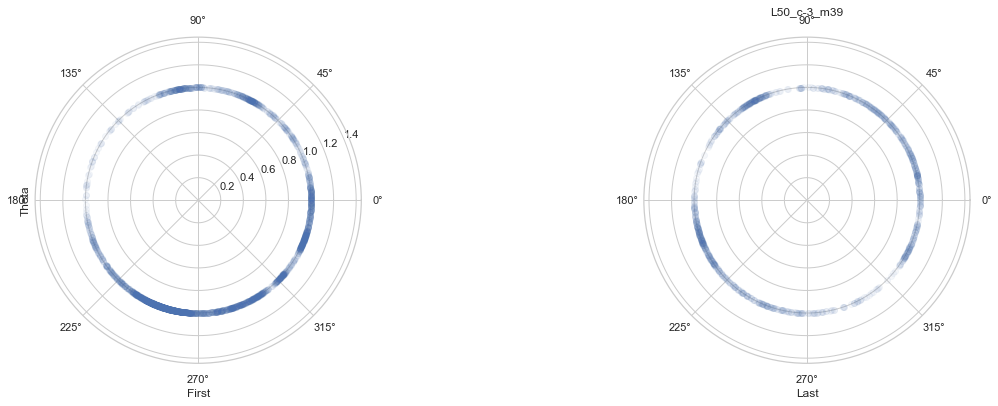

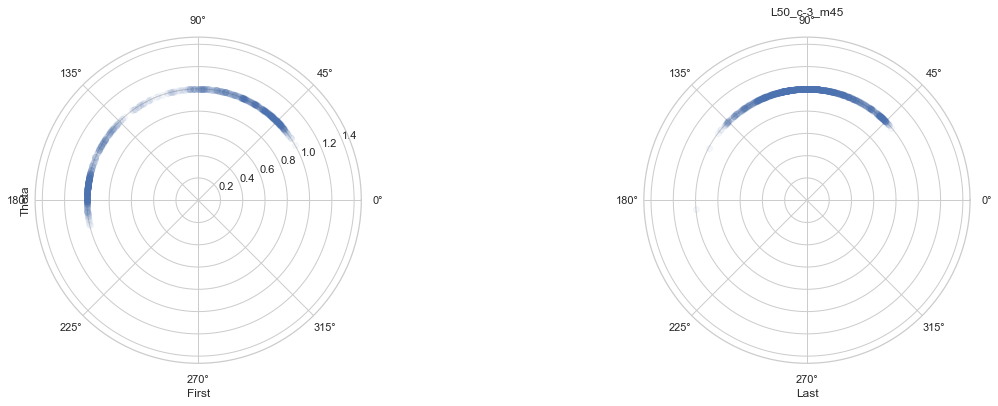

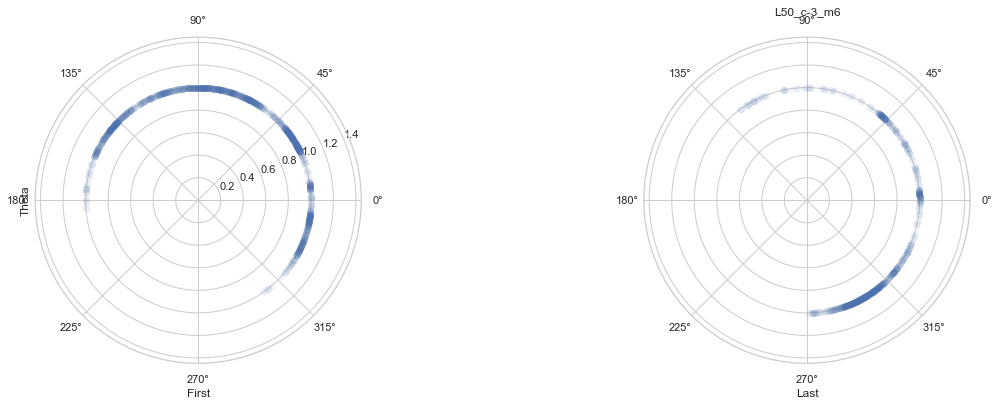

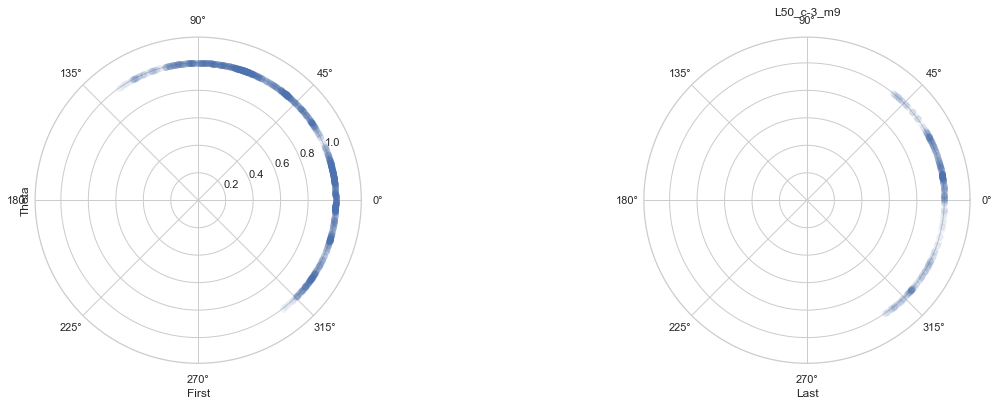

In [64]:
for name in nam_51: 

    theta_pulled_first = FL_df[(FL_df.name == name) & (FL_df.Visit.str.contains('First'))].Theta * np.pi/180
    theta_pulled_last = FL_df[(FL_df.name == name) & (FL_df.Visit.str.contains('Last'))].Theta * np.pi/180


    rad_first_visit = FL_df[(FL_df.name == name) & (FL_df.Visit.str.contains('First'))].Radial_Length
    rad_last_visit = FL_df[(FL_df.name == name) & (FL_df.Visit.str.contains('Last'))].Radial_Length
    

    if any(list(~np.isnan(rad_first_visit))) == True or any(list(~np.isnan(rad_last_visit))) == True:
        fig, ax = plt.subplots(1, 2, sharex = True, sharey = True, figsize = (20,6), subplot_kw=dict(polar=True))

        radif = np.ones(len(rad_first_visit))
        radil = np.ones(len(rad_last_visit))

        ax[0].scatter(theta_pulled_first,radif, alpha = 0.05)
        ax[0].set_ylabel("Theta")
        ax[0].set_xlabel("First")
        ax[1].scatter(theta_pulled_last,radil, alpha = 0.05)
        ax[1].set_title(name)
        ax[1].set_xlabel("Last")
        plt.savefig(r"C:\Users\Daniellab\Desktop\Light_level_videos_second_batch\Data\Motion_Analysis\Theta_Plot\Scatter" + "\\" + name + "_Scatter.png")
    else:
        print(name)
    


In [58]:
pca_path = r"C:\Users\Daniellab\Desktop\Light_level_videos_second_batch\Data\Motion_Analysis\HeatMap\CSV"

L0.1_c-3_m10


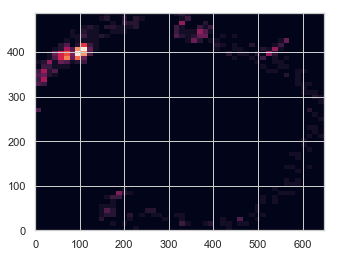

L0.1_c-3_m12


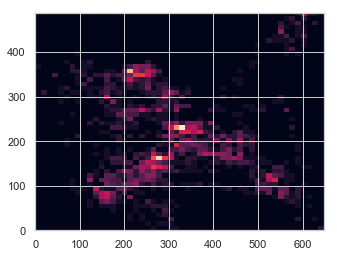

L0.1_c-3_m20


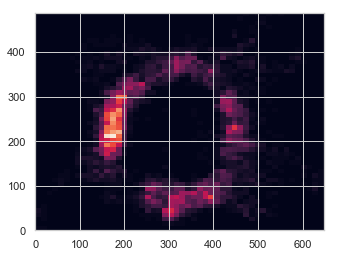

L0.1_c-3_m21


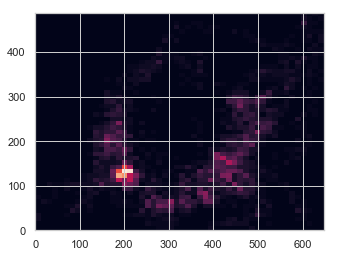

L0.1_c-3_m22


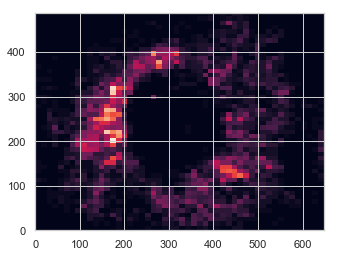

L0.1_c-3_m23


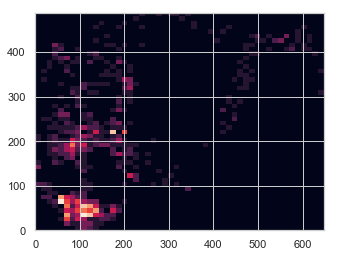

L0.1_c-3_m24


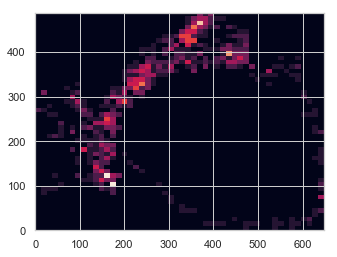

L0.1_c-3_m25


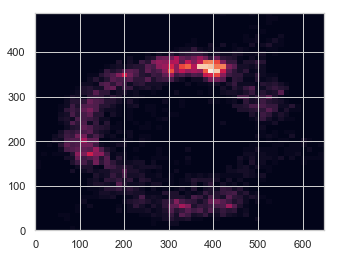

L0.1_c-3_m27


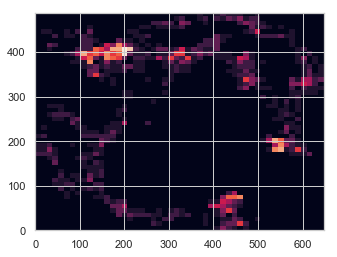

L0.1_c-3_m2


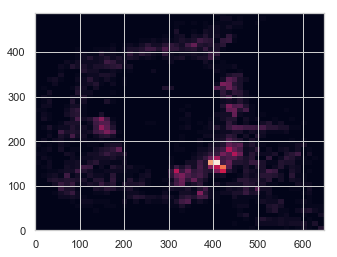

L0.1_c-3_m32


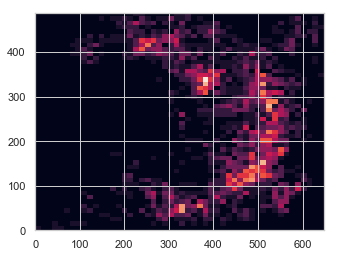

L0.1_c-3_m34


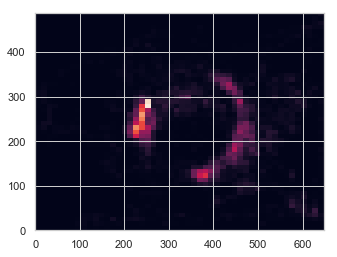

L0.1_c-3_m37


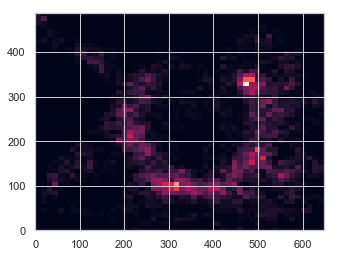

L0.1_c-3_m38


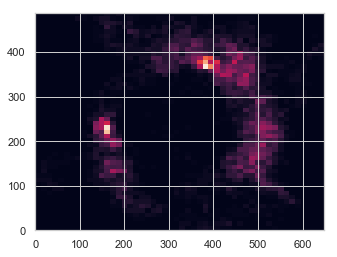

L0.1_c-3_m39


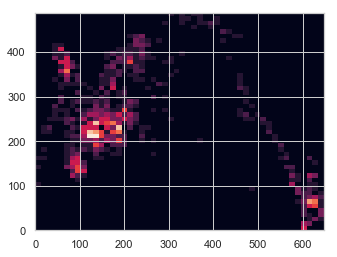

L0.1_c-3_m40


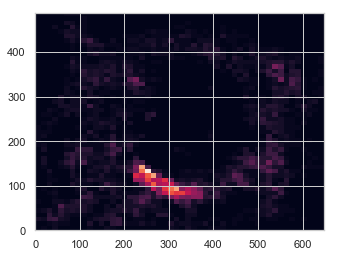

L0.1_c-3_m41


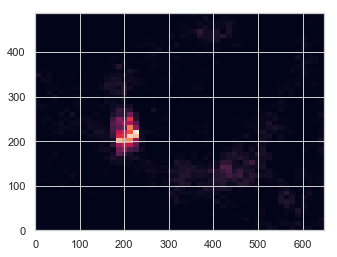

L0.1_c-3_m43


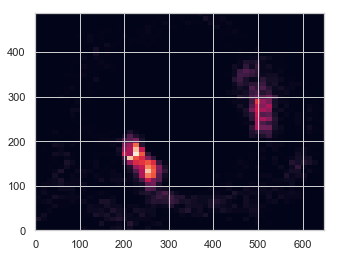

L0.1_c-3_m44


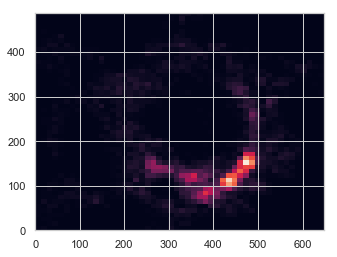

L0.1_c-3_m5


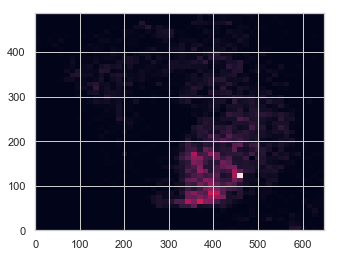

L0.1_c-3_m8


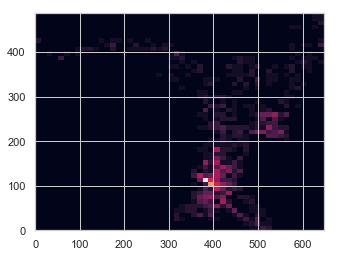

L50_c-3_m10


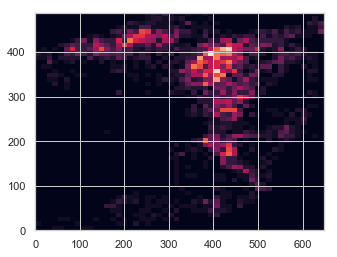

L50_c-3_m12


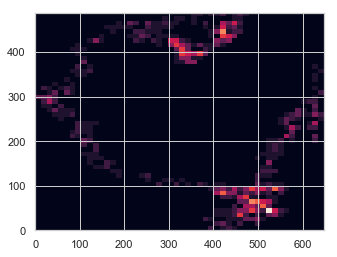

L50_c-3_m13


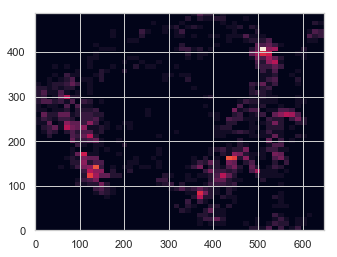

L50_c-3_m14


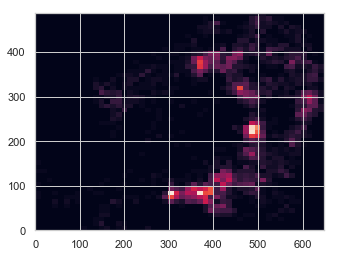

L50_c-3_m15


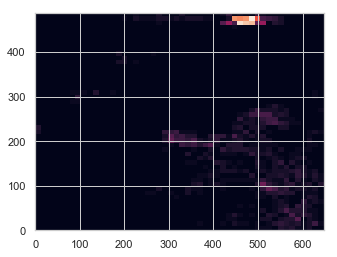

L50_c-3_m21


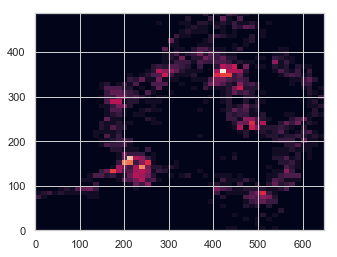

L50_c-3_m22


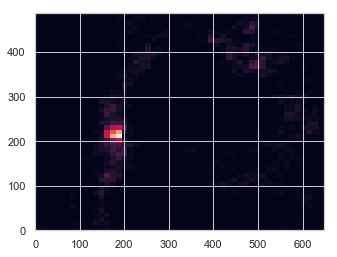

L50_c-3_m24


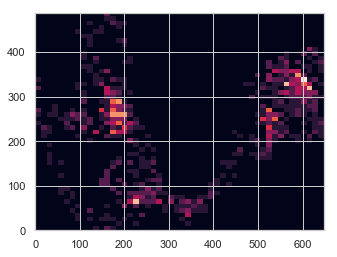

L50_c-3_m25


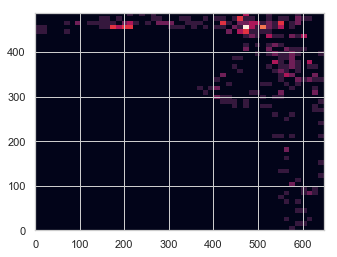

L50_c-3_m26


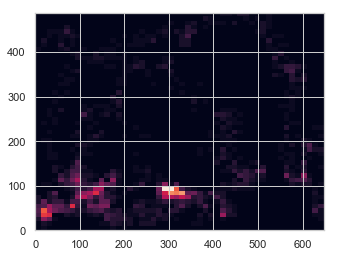

L50_c-3_m2


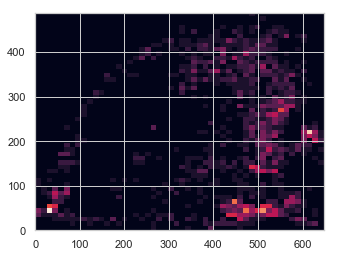

L50_c-3_m30


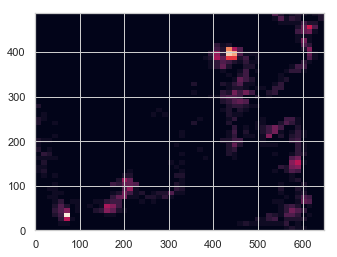

L50_c-3_m32


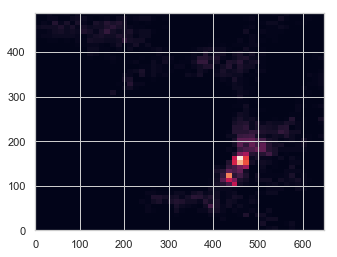

L50_c-3_m33


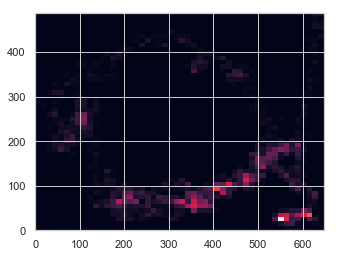

L50_c-3_m34


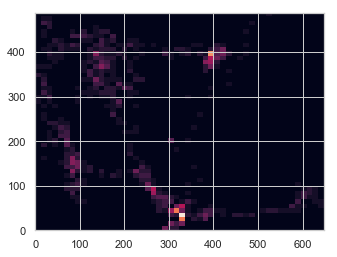

L50_c-3_m35


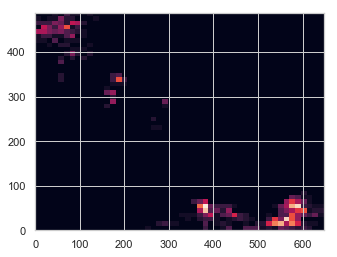

L50_c-3_m37


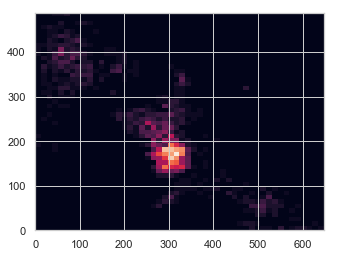

L50_c-3_m38


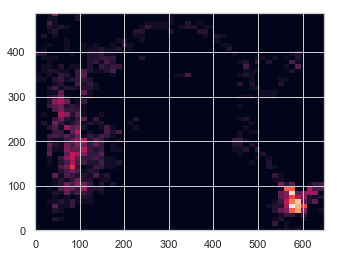

L50_c-3_m39


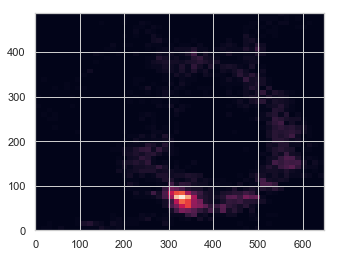

L50_c-3_m45


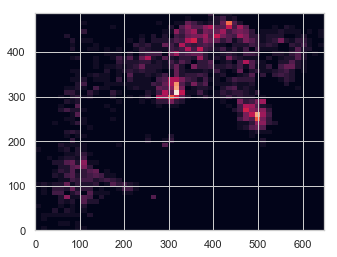

L50_c-3_m6


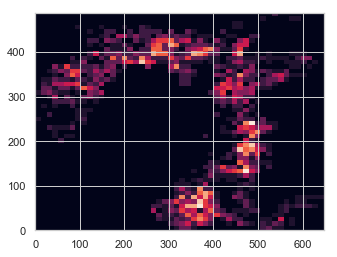

L50_c-3_m9


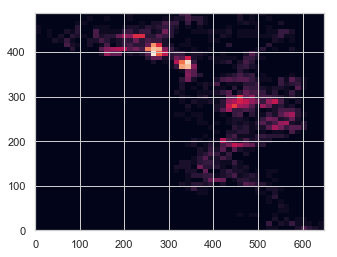

In [59]:
# Generate some test data
# data = pd.DataFrame()

heatmap_FL = pd.DataFrame()
for name in first_heat_list:
    print(name)
    temp = FL_df[(FL_df.name == name)]
    x = temp.loc[temp.X_position.notnull(), 'X_position']
    y = temp.loc[temp.X_position.notnull(), 'Y_position']



    heatmap, xedges, yedges = np.histogram2d(x, y, bins=50)
    extent = [0, 648, 0, 488]
    
    hmv_FL = pd.Series(heatmap.flatten(),name=name)
    heatmap_FL = heatmap_FL.append(hmv_FL)
#     heatmap_FL.to_csv(pca_path + "\heatmap_vectors_FL.csv")
    plt.clf()
    plt.imshow(heatmap.T, extent=extent, origin='lower')
#     
#     plt.savefig(outpath_fig_ + "\\EntireTrial" + "\\" + name + "EntireTrial_HeatMap.png")
    plt.show()

In [ ]:
dfd = pd.read_csv(pca_path + "\heatmap_vectors.csv")
dfd = dfd.set_index('Unnamed: 0')

In [ ]:
dfd

In [ ]:
# Generate some test data
outpath_fig_ = r"C:\Users\Daniellab\Desktop\Light_level_videos_second_batch\Data\Motion_Analysis\HeatMap"
for name in nam_51[-3:-2]:
    
    x = dFrame[(dFrame.name == name) & (dFrame.X_position.notnull())].X_position 
    y = dFrame[(dFrame.name == name) & (dFrame.Y_position.notnull())].Y_position

    fig, ax = plt.subplots(1, 1, figsize = (6,6), subplot_kw=dict(polar=False))

    counts, xedges, yedges, im = ax.hist2d(x, y, bins=50)
    fig.colorbar(im)
    ax.set_ylim(0,488)
    ax.set_xlim(0,648)
    plt.gca().invert_yaxis()
    extent = [0, 648, 488, 0]
    
#     plt.clf()
#     plt.imshow(heatmap, extent=extent, origin='lower')
    
#     plt.savefig(outpath_fig_ + "\\" + name + "_heatMap_setbin.png")
    plt.show()

L0.1_c-3_m10


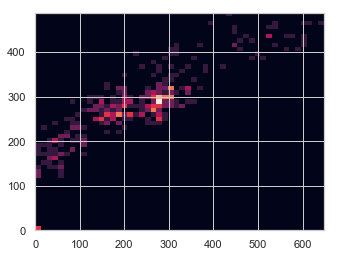

L0.1_c-3_m12


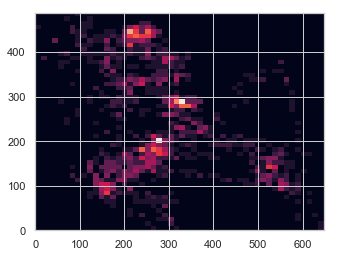

L0.1_c-3_m20


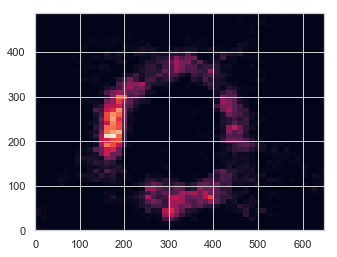

L0.1_c-3_m21


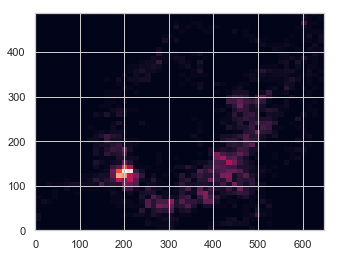

L0.1_c-3_m22


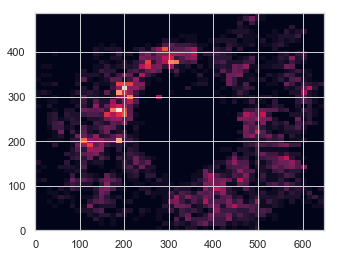

L0.1_c-3_m23


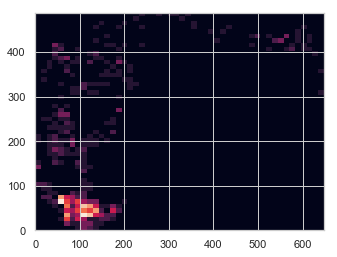

L0.1_c-3_m24


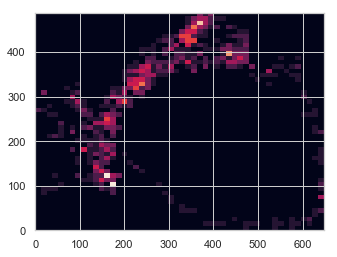

L0.1_c-3_m25


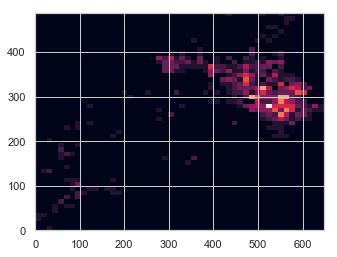

L0.1_c-3_m27


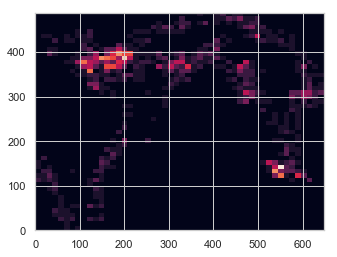

L0.1_c-3_m2


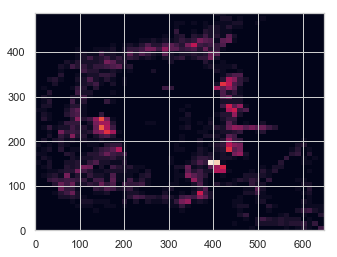

L0.1_c-3_m32


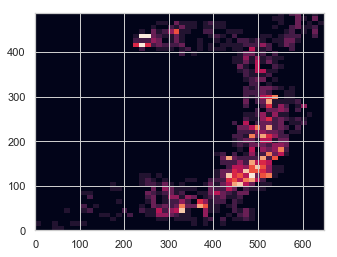

L0.1_c-3_m34


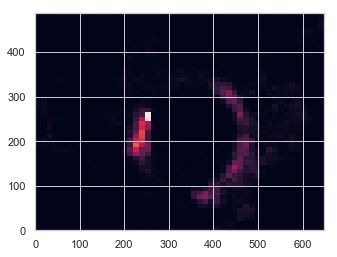

L0.1_c-3_m37


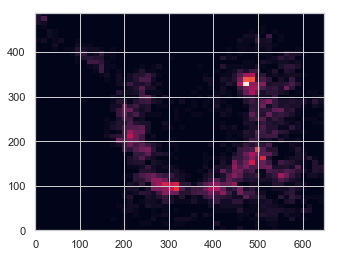

L0.1_c-3_m38


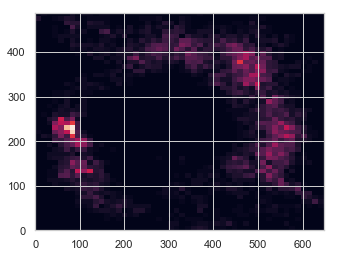

L0.1_c-3_m39


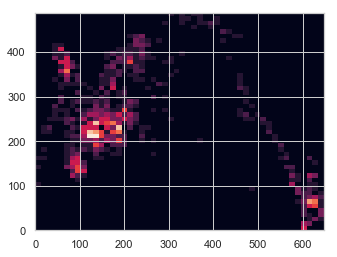

L0.1_c-3_m40


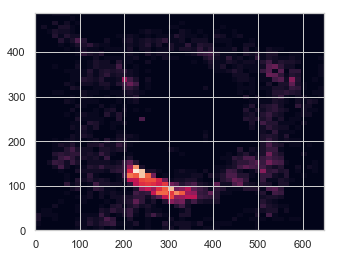

L0.1_c-3_m41


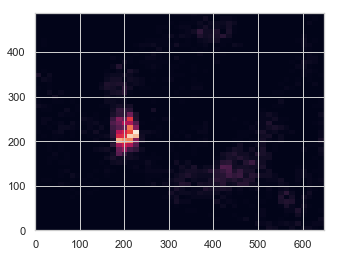

L0.1_c-3_m43


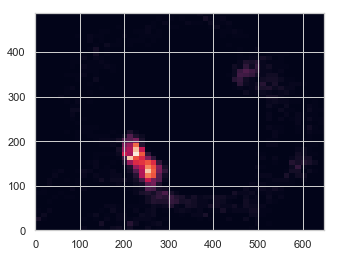

L0.1_c-3_m44


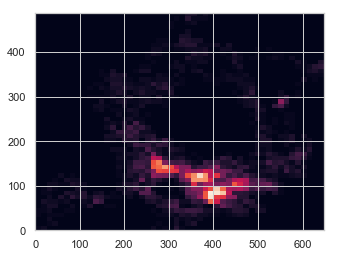

L0.1_c-3_m5


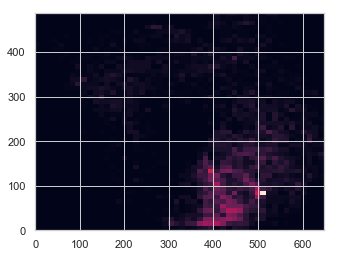

L0.1_c-3_m8


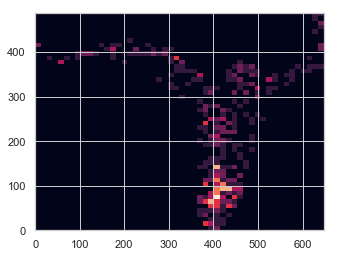

L50_c-3_m10


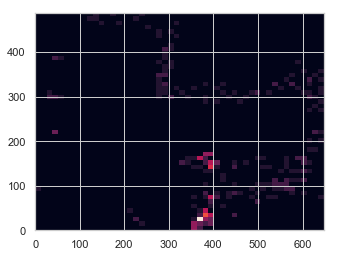

L50_c-3_m12


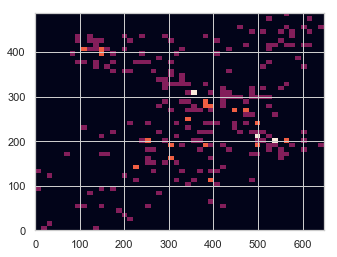

L50_c-3_m13


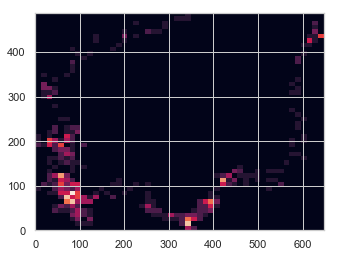

L50_c-3_m14


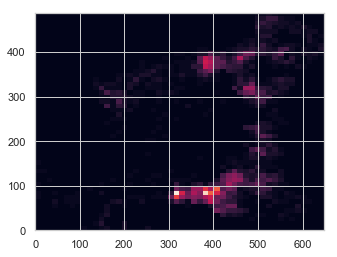

L50_c-3_m15


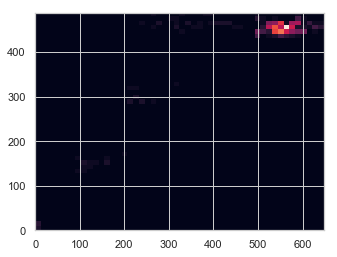

L50_c-3_m21


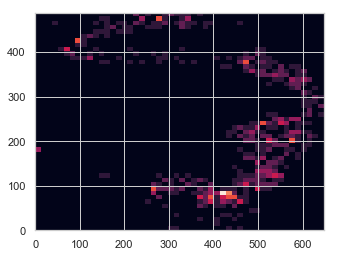

L50_c-3_m22


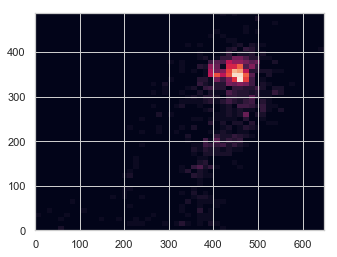

L50_c-3_m24


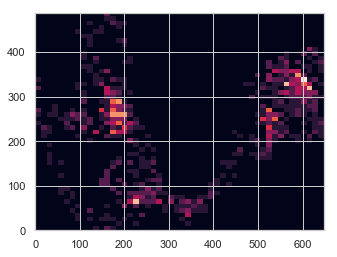

L50_c-3_m25


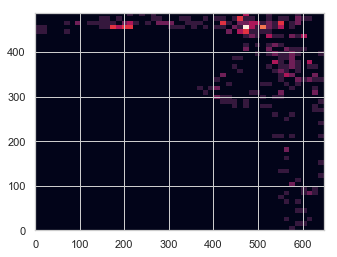

L50_c-3_m26


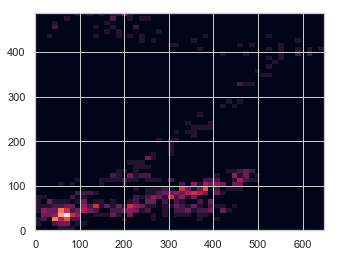

L50_c-3_m2


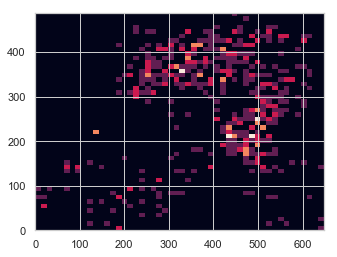

L50_c-3_m30


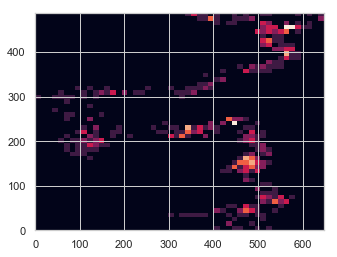

L50_c-3_m32


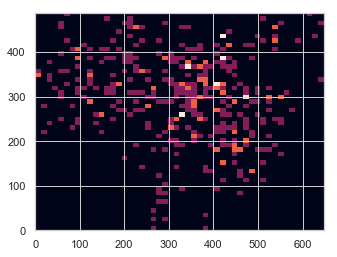

L50_c-3_m33


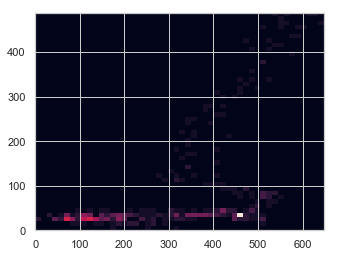

L50_c-3_m34


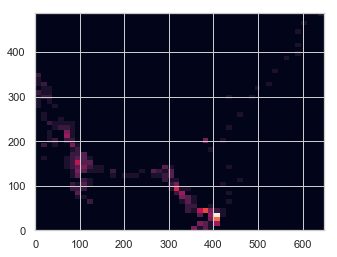

L50_c-3_m35


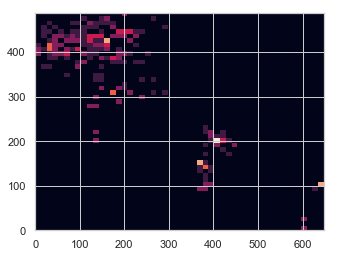

L50_c-3_m37


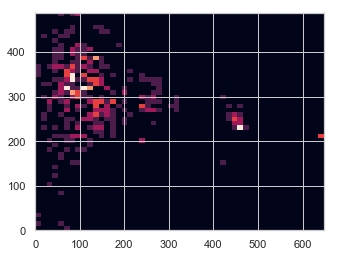

L50_c-3_m38


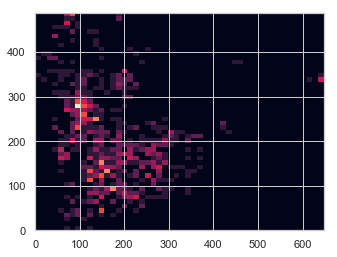

L50_c-3_m39


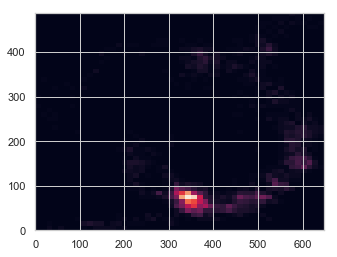

L50_c-3_m45


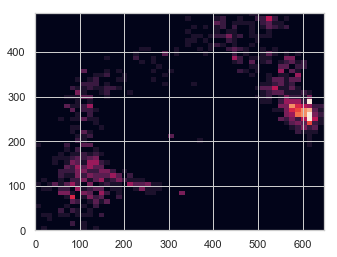

L50_c-3_m6


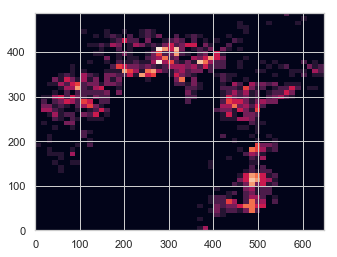

L50_c-3_m9


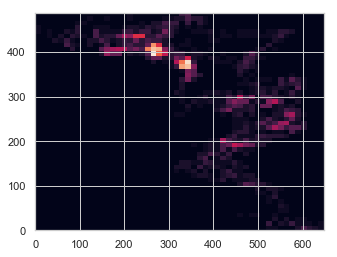

In [60]:
# Generate some test data
outpath_fig_first = r"C:\Users\Daniellab\Desktop\Light_level_videos_second_batch\Data\Motion_Analysis\HeatMap\First"
dataf = pd.DataFrame()
first_heat_list = ['L0.1_c-3_m10', 'L0.1_c-3_m12', 'L0.1_c-3_m20', 'L0.1_c-3_m21',
       'L0.1_c-3_m22', 'L0.1_c-3_m23', 'L0.1_c-3_m24', 'L0.1_c-3_m25',
       'L0.1_c-3_m27', 'L0.1_c-3_m2', 'L0.1_c-3_m32', 'L0.1_c-3_m34',
       'L0.1_c-3_m37', 'L0.1_c-3_m38', 'L0.1_c-3_m39', 'L0.1_c-3_m40',
       'L0.1_c-3_m41', 'L0.1_c-3_m43', 'L0.1_c-3_m44', 'L0.1_c-3_m5',
       'L0.1_c-3_m8', 'L50_c-3_m10', 'L50_c-3_m12', 'L50_c-3_m13',
       'L50_c-3_m14', 'L50_c-3_m15', 'L50_c-3_m21', 'L50_c-3_m22',
       'L50_c-3_m24', 'L50_c-3_m25', 'L50_c-3_m26', 'L50_c-3_m2',
       'L50_c-3_m30', 'L50_c-3_m32', 'L50_c-3_m33', 'L50_c-3_m34',
       'L50_c-3_m35', 'L50_c-3_m37', 'L50_c-3_m38', 'L50_c-3_m39',
       'L50_c-3_m45', 'L50_c-3_m6', 'L50_c-3_m9']

for name in first_heat_list:
    print(name)
    
    temp = FL_df[(FL_df.name == name) & (FL_df.Visit.str.contains('First'))]
    x = temp.loc[temp.X_position.notnull(), 'X_position']
    y = temp.loc[temp.X_position.notnull(), 'Y_position']

   

    heatmap, xedges, yedges = np.histogram2d(x, y, bins=50)
    extent = [0, 648, 0, 488]

    
    hmv_first = pd.Series(heatmap.flatten(),name=name)
    
    dataf = dataf.append(hmv_first)
    dataf.to_csv(pca_path + "\heatmap_vectors_first.csv")

    plt.clf()
    plt.imshow(heatmap.T, extent=extent, origin='lower')
    
#     plt.savefig(outpath_fig_first + "\\" + name + "FirstTrial_HeatMap.png")
    plt.show()

L0.1_c-3_m10


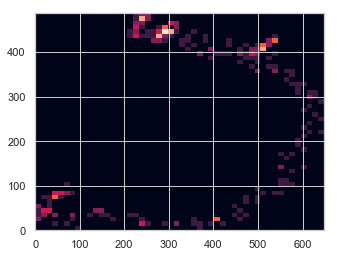

L0.1_c-3_m12


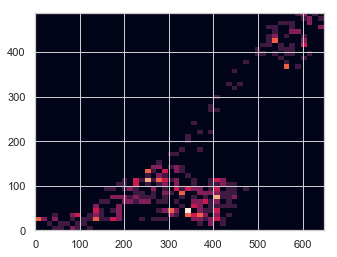

L0.1_c-3_m20


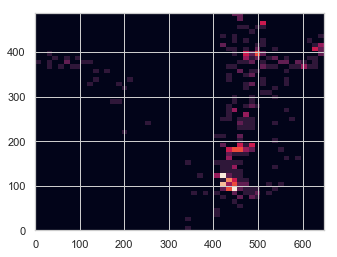

L0.1_c-3_m21


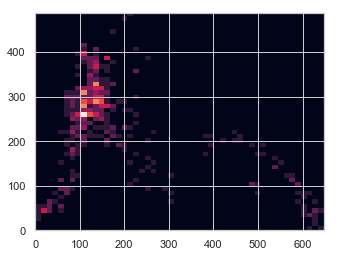

L0.1_c-3_m22


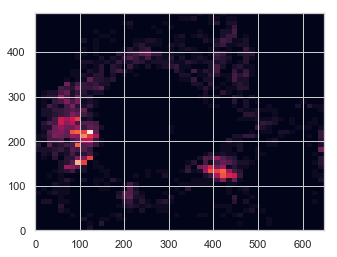

L0.1_c-3_m23


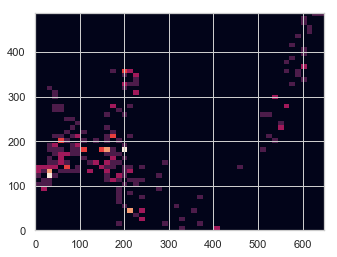

L0.1_c-3_m25


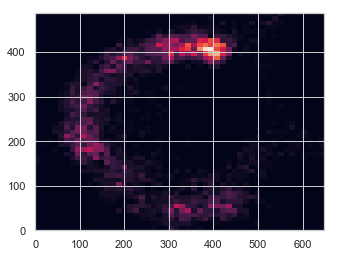

L0.1_c-3_m27


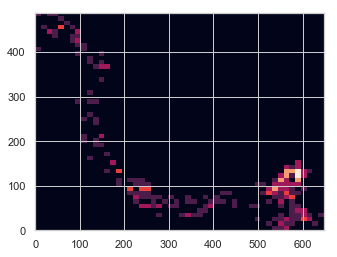

L0.1_c-3_m2


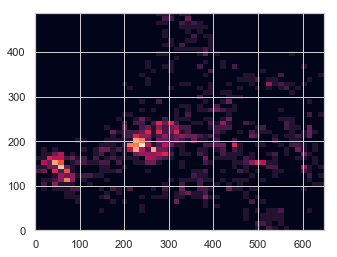

L0.1_c-3_m32


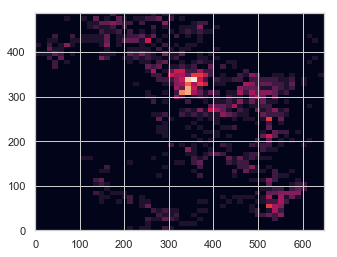

L0.1_c-3_m34


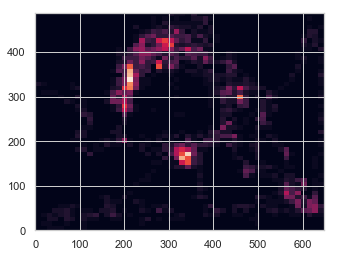

L0.1_c-3_m37


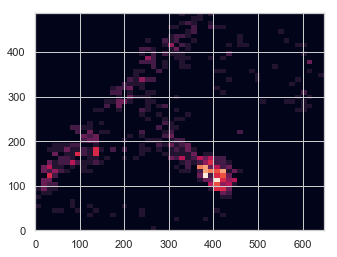

L0.1_c-3_m38


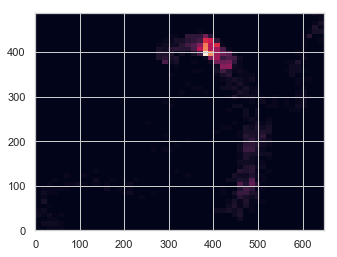

L0.1_c-3_m40


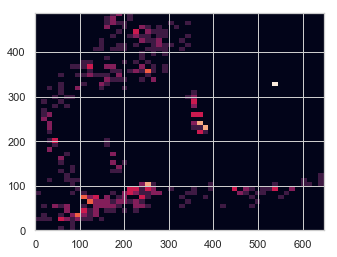

L0.1_c-3_m41


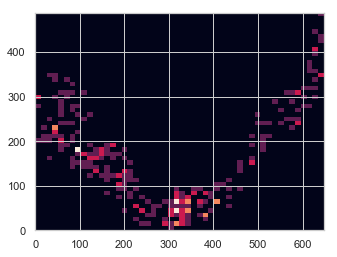

L0.1_c-3_m43


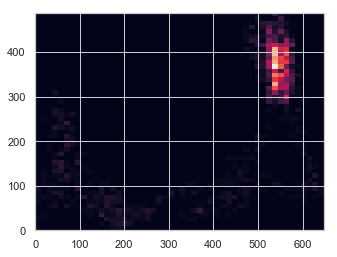

L0.1_c-3_m44


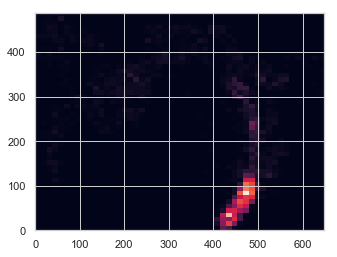

L0.1_c-3_m5


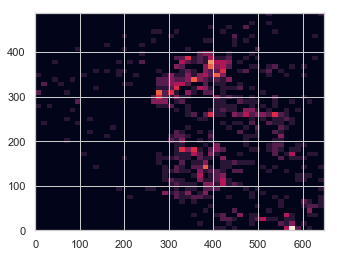

L0.1_c-3_m8


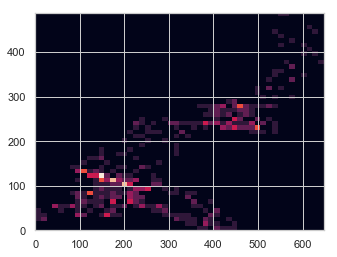

L50_c-3_m10


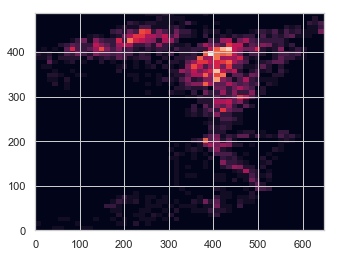

L50_c-3_m12


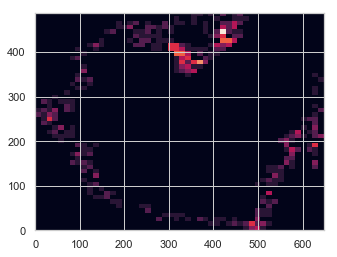

L50_c-3_m13


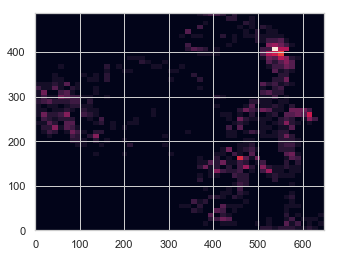

L50_c-3_m14


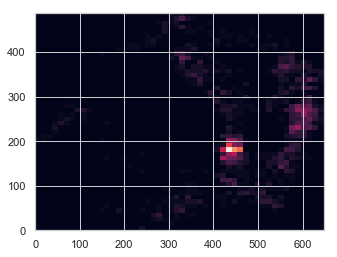

L50_c-3_m15


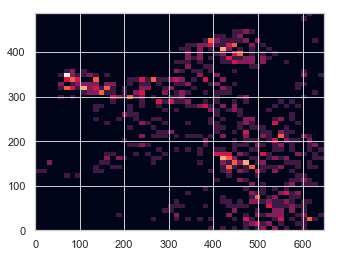

L50_c-3_m21


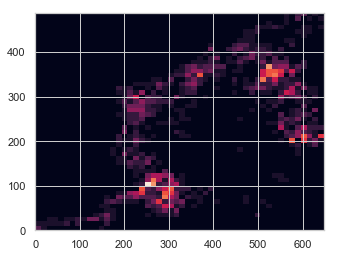

L50_c-3_m22


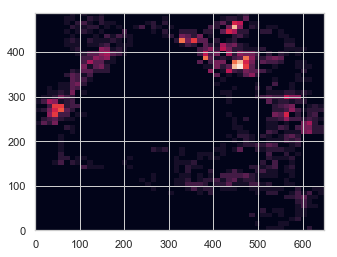

L50_c-3_m26


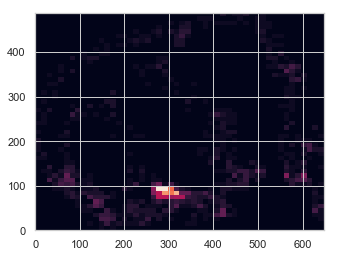

L50_c-3_m2


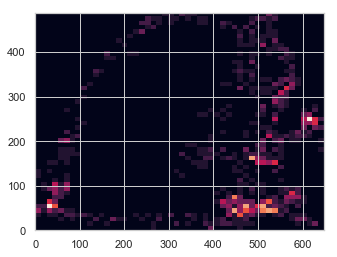

L50_c-3_m30


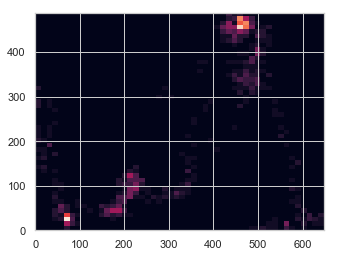

L50_c-3_m32


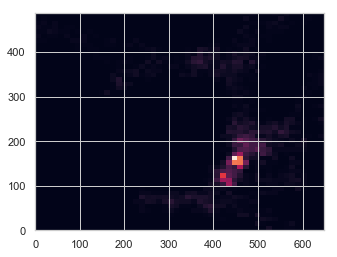

L50_c-3_m33


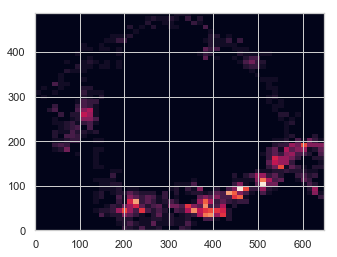

L50_c-3_m34


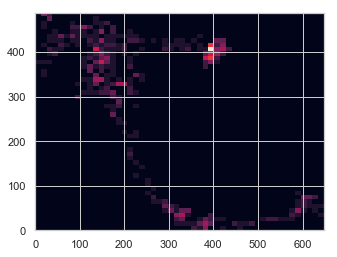

L50_c-3_m35


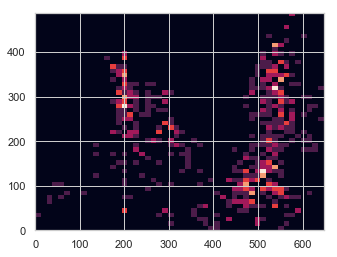

L50_c-3_m37


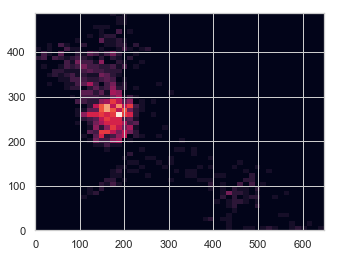

L50_c-3_m38


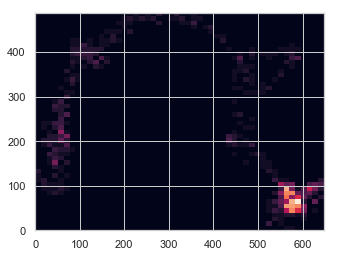

L50_c-3_m39


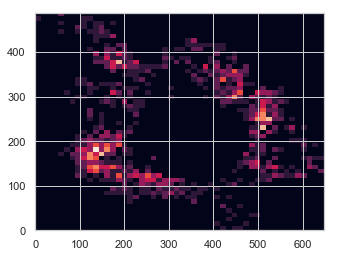

L50_c-3_m45


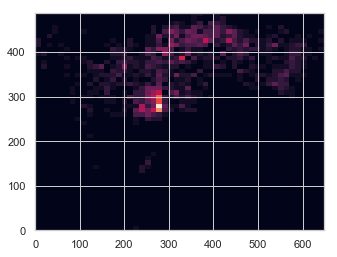

L50_c-3_m6


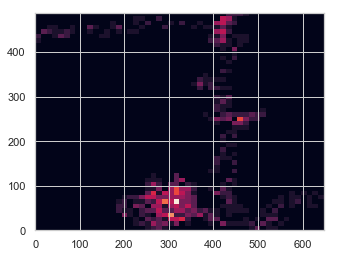

L50_c-3_m9


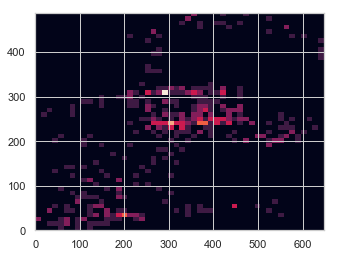

In [61]:
# Generate some test data
outpath_fig_last = r"C:\Users\Daniellab\Desktop\Light_level_videos_second_batch\Data\Motion_Analysis\HeatMap\Last"
dataf = pd.DataFrame()
last_heat_list = ['L0.1_c-3_m10', 'L0.1_c-3_m12', 'L0.1_c-3_m20', 'L0.1_c-3_m21',
       'L0.1_c-3_m22', 'L0.1_c-3_m23', 'L0.1_c-3_m25',
       'L0.1_c-3_m27', 'L0.1_c-3_m2', 'L0.1_c-3_m32', 'L0.1_c-3_m34',
       'L0.1_c-3_m37', 'L0.1_c-3_m38', 'L0.1_c-3_m40',
       'L0.1_c-3_m41', 'L0.1_c-3_m43', 'L0.1_c-3_m44', 'L0.1_c-3_m5',
       'L0.1_c-3_m8', 'L50_c-3_m10', 'L50_c-3_m12', 'L50_c-3_m13',
       'L50_c-3_m14', 'L50_c-3_m15', 'L50_c-3_m21', 'L50_c-3_m22',
       'L50_c-3_m26', 'L50_c-3_m2',
       'L50_c-3_m30', 'L50_c-3_m32', 'L50_c-3_m33', 'L50_c-3_m34',
       'L50_c-3_m35', 'L50_c-3_m37', 'L50_c-3_m38', 'L50_c-3_m39',
       'L50_c-3_m45', 'L50_c-3_m6', 'L50_c-3_m9']

for name in last_heat_list:
    print(name)
    
    temp = FL_df[(FL_df.name == name) & (FL_df.Visit.str.contains('Last'))]
    x = temp.loc[temp.X_position.notnull(), 'X_position']
    y = temp.loc[temp.X_position.notnull(), 'Y_position']

   

    heatmap, xedges, yedges = np.histogram2d(x, y, bins=50)
    extent = [0, 648, 0, 488]

    
    hmv_first = pd.Series(heatmap.flatten(),name=name)
    
    dataf = dataf.append(hmv_first)
    dataf.to_csv(pca_path + "\heatmap_vectors_last.csv")

    plt.clf()
    plt.imshow(heatmap.T, extent=extent, origin='lower')
    
#     plt.savefig(outpath_fig_last + "\\" + name + "LastTrial_HeatMap.png")
    plt.show()

In [62]:
len(first_heat_list), len(last_heat_list)

(43, 39)